In [1]:
import os
import sys
sys.path.append(os.path.abspath("/users/amtseng/tfmodisco/notebooks/reports/"))
sys.path.append(os.path.abspath("/users/amtseng/tfmodisco/src/"))
import motif.tfmodisco_hit_scoring as tfmodisco_hit_scoring
import plot.viz_sequence as viz_sequence
from util import figure_to_vdom_image, create_motif_similarity_matrix, aggregate_motifs
import h5py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.font_manager as font_manager
import scipy.signal
import scipy.cluster.hierarchy
import vdom.helpers as vdomh
from IPython.display import display
import tqdm
tqdm.tqdm_notebook(range(1))

/users/amtseng/miniconda3/envs/tfmodisco-mini/lib/python3.7/site-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|<bar/>| 0/1 [00:00<?, ?it/s]

In [2]:
# Plotting defaults
font_manager.fontManager.ttflist.extend(
    font_manager.createFontList(
        font_manager.findSystemFonts(fontpaths="/users/amtseng/modules/fonts")
    )
)
plot_params = {
    "figure.titlesize": 22,
    "axes.titlesize": 22,
    "axes.labelsize": 20,
    "legend.fontsize": 18,
    "xtick.labelsize": 16,
    "ytick.labelsize": 16,
    "font.family": "Roboto",
    "font.weight": "bold",
    "svg.fonttype": "none"
}
plt.rcParams.update(plot_params)

/users/amtseng/miniconda3/envs/tfmodisco-mini/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The createFontList function was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use FontManager.addfont instead.
  after removing the cwd from sys.path.


In [3]:
tf_name = "E2F6"
num_tasks = 2

tfm_motif_file = "/users/amtseng/tfmodisco/results/motifs/tfmodisco/%s_tfmodisco_cpmerged_motifs.h5" % tf_name
meme_motif_file = "/users/amtseng/tfmodisco/results/motifs/meme/%s_meme_motifs.h5" % tf_name
homer_motif_file = "/users/amtseng/tfmodisco/results/motifs/homer/%s_homer_motifs.h5" % tf_name
dichipmunk_motif_file = "/users/amtseng/tfmodisco/results/motifs/dichipmunk/%s_dichipmunk_motifs.h5" % tf_name

best_model_types = list("MM")

multitask_finetune_model_def_tsv = "/users/amtseng/tfmodisco/results/model_stats/multitask_profile_finetune_stats.tsv"
singletask_finetune_model_def_tsv = "/users/amtseng/tfmodisco/results/model_stats/singletask_profile_finetune_stats.tsv"

### Helper functions

In [4]:
def get_motif_hit_paths():
    """
    Returns a list of pairs, where each pair is the count and profile
    motif hit paths for the task.
    """
    # First, import the best fold deifnitions
    
    # Finetuned multi-task model
    best_mt_fold = None
    with open(multitask_finetune_model_def_tsv, "r") as f:
        for line in f:
            tokens = line.strip().split("\t")
            if tokens[0] == tf_name and int(tokens[1]) == num_tasks - 1:
                assert best_mt_fold is None
                best_mt_fold = int(tokens[2])

    # Finetuned single-task models
    best_st_folds = []
    with open(singletask_finetune_model_def_tsv, "r") as f:
        for line in f:
            tokens = line.strip().split("\t")
            if tokens[0] == tf_name:
                best_st_folds.append(int(tokens[2]))
                
    assert len(best_st_folds) == num_tasks

    # Get paths to motif hits
    task_motif_hit_paths = []
    base_path = "/users/amtseng/tfmodisco/results/tfmodisco_hit_scoring"
    for task_index, model_type in enumerate(best_model_types):
        if model_type == "M":
            path = os.path.join(
                base_path,
                "multitask_profile_finetune",
                "%s_multitask_profile_finetune_task%d_fold%d_{0}" % (tf_name, task_index, best_mt_fold),
                "tfm_matches.bed"
            )
        else:
            path = os.path.join(
                base_path,
                "singletask_profile_finetune",
                "%s_singletask_profile_finetune_fold%d_{0}" % (tf_name, best_st_folds[task_index]),
                "task_%d" % task_index,
                "tfm_matches.bed"
            )
        task_motif_hit_paths.append(
            (path.format("count"), path.format("profile"))
        )
    return task_motif_hit_paths

In [5]:
def import_tfmodisco_motifs(motif_file, model_types):
    """
    From a file containing all motifs for that TF, imports the
    trimmed CWMs of the fine-tuned models corresponding to the
    model type for each task.
    Returns a list of dictionaries (one for each task), where
    each dictionary maps motif key to motif.
    """
    motifs = []
    with h5py.File(motif_file, "r") as f:
        mtft = f["multitask_finetune"]
        stft = f["singletask_finetune"]
        for i, model_type in enumerate(model_types):
            task = "task_%d" % i
            if model_type == "M":
                dset = mtft[task]
            else:
                dset = stft[task]
            task_motifs = {}
            for motif_key in dset.keys():
                task_motifs["T%d:%s" % (i, motif_key)] = dset[motif_key]["cwm_trimmed"][:]
            motifs.append(task_motifs)
    return motifs

In [6]:
def import_classic_benchmark_motifs(motif_file, mode):
    """
    From a file containing all motifs for that TF from a benchmark
    method, imports the PFMs of the motifs for each task.
    Returns a list of dictionaries (one for each task), where
    each dictionary maps motif key to motif.
    """
    if mode == "dichipmunk":
        score_key = "supporting_seqs"
    elif mode == "homer":
        score_key = "log_enrichment"
    elif mode == "meme":
        score_key = "evalue"
    motifs = []
    with h5py.File(motif_file, "r") as f:
        tasks = sorted([int(key[5:]) for key in f.keys() if key != "task_agg"])
        for i in tasks:
            dset = f["task_%d" % i]
            task_motifs = {}
            for motif_key in dset.keys():
                if motif_key == score_key:
                    continue
                task_motifs["T%d:%s" % (i, motif_key)] = dset[motif_key][:]
            motifs.append(task_motifs)
    return motifs

### Import motifs

In [7]:
tfm_motifs = import_tfmodisco_motifs(tfm_motif_file, best_model_types)
meme_motifs = import_classic_benchmark_motifs(meme_motif_file, "meme")
homer_motifs = import_classic_benchmark_motifs(homer_motif_file, "homer")
dichipmunk_motifs = import_classic_benchmark_motifs(dichipmunk_motif_file, "dichipmunk")

### Cluster the TF-MoDISco motifs across each task
We need to decide which ones to merge together. We start with a best guess for clustering, and then manually decide on the right motifs from each task to cluster.

In [8]:
# Flatten all TF-MoDISco motifs across all tasks into a single list
tfm_motif_keys = [list(d.keys()) for d in tfm_motifs]
tfm_motif_cwms = [[tfm_motifs[i][key] for key in tfm_motif_keys[i]] for i in range(len(tfm_motif_keys))]
tfm_motif_keys = sum(tfm_motif_keys, [])
tfm_motif_cwms = sum(tfm_motif_cwms, [])

In [9]:
# Compute similarity matrix
sim_matrix = create_motif_similarity_matrix(tfm_motif_cwms)

In [10]:
# Compute linkage and clusters
dist_matrix = 1 - sim_matrix
np.fill_diagonal(dist_matrix, 0)
dist_vec = scipy.spatial.distance.squareform(dist_matrix)

cluster_distance = 0.3  # On the greedy side
linkage = scipy.cluster.hierarchy.linkage(dist_vec, method="ward")
clusters = scipy.cluster.hierarchy.fcluster(
    linkage, cluster_distance, criterion="distance"
)

In [11]:
# Show aggregated and constituent motifs for each cluster
colgroup = vdomh.colgroup(
    vdomh.col(style={"width": "45%"}),
    vdomh.col(style={"width": "45%"}),
    vdomh.col(style={"width": "10%"})
)

header = vdomh.thead(
    vdomh.tr(
        vdomh.th("Aggregate motif", style={"text-align": "center"}),
        vdomh.th("Constituent motifs", style={"text-align": "center"}),
        vdomh.th("Constituent motif IDs", style={"text-align": "center"})
    )
)

cluster_ids, counts = np.unique(clusters, return_counts=True)
for i, cluster_id in enumerate(cluster_ids):
    match_inds = np.where(clusters == cluster_id)[0]
    matches = [tfm_motif_cwms[j] for j in match_inds]
    match_keys = [tfm_motif_keys[j] for j in match_inds]
    
    consensus = aggregate_motifs(matches)
    
    display(vdomh.h3("Cluster %d (%d/%d)" % (cluster_id, i + 1, len(cluster_ids))))
    display(vdomh.h4("%d motifs" % len(matches)))
    
    agg_fig = viz_sequence.plot_weights(consensus, figsize=(20, 4), return_fig=True)
    agg_fig.tight_layout()
    
    const_figs = []
    for motif in matches:
        fig = viz_sequence.plot_weights(motif, figsize=(20, 4), return_fig=True)
        fig.tight_layout()
        const_figs.append(figure_to_vdom_image(fig))

    body = vdomh.tbody(*([
        vdomh.tr(
            vdomh.td(figure_to_vdom_image(agg_fig), rowspan=str(len(matches))),
            vdomh.td(const_figs[0]),
            vdomh.td(match_keys[0])
        )] + [
            vdomh.tr(
                vdomh.td(const_figs[j + 1]),
                vdomh.td(match_keys[j + 1])
            ) for j in range(len(matches) - 1)
        ]
    ))
    display(vdomh.table(colgroup, header, body))
    plt.close("all")

<h3>Cluster 1 (1/10)</h3>

<h4>2 motifs</h4>

<table><colgroup><col style="width: 45%"></col><col style="width: 45%"></col><col style="width: 10%"></col></colgroup><thead><tr><th style="text-align: center">Aggregate motif</th><th style="text-align: center">Constituent motifs</th><th style="text-align: center">Constituent motif IDs</th></tr></thead><tbody><tr><td rowspan="2"><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAACh2UlEQVR4nOzdd7wcVf3/8dfMtrt7S3oPIYFAQgstdBBQunS/CAKCIE39WsCffkEFBbvYRUUQKyKKCtJ774QAoYSQ3stNuXXv1pnfH2cnd3Nz287u3r3l/eQxbJ3ZcyezszOf%2BZzPsVzXRURERERERERERESk1OxKN0BEREREREREREREBicFoEVERERERERERESkLBSAFhEREREREREREZGyUABaRERERERERERERMpCAWgRERERERERERERKQsFoEVERERERERERESkLBSAFhEREREREREREZGyUABaRERERERERERERMpCAWgRERERERERERERKQsFoEVERERERERERESkLIKVbkCpjB492p06dWqlmyEiIiIiIiIiIiIyqL3%2B%2BusbXdcd05v3%2Bg5AW5Z1OXAVMBVYB9wGfMd1XaeH%2BXYFLgI%2B7rruzh1e%2BwLwi05mS7quW9XdcqdOncqcOXN6/weIiIiIiIiIiIiISMEsy1re2/f6CkBblnUpcHPuYRyYAlwPxICru5jnQuBS4LDcU8lO3jY5d9sCtOY9n/DTThERERERERERERGpHL81oL%2BRu/2q67rVwIW5x1%2B0LKuui3l%2BgQk%2Bt3bxOsCk3O3VruuOz5um%2BmyniIiIiIiIiIiIiFRIwQFoy7KmYTKeAW7N3d4ONANVwOwuZv0tcCRwajeL9zKgVxXaLhERERERERERERHpX/xkQE/I3aZd120AyNV93pB7fnxnM7mue43rus8C3dWI9gLQX7Esq9GyrC2WZf2xm6xqEREREREREREREemn/ASgw7nbjoHkTIfX/ZiYuz0E07bhwKeAW4pYpoiIiIiIiIiIiIhUgN8a0OVyNHAVMMl13VrgM7nnP25Z1g4d32xZ1mWWZc2xLGtOfX19X7ZTRERERERERERERHrgJwCdzt0GOjzvPU76bYzrui%2B7rvsz13XX5R7fDDQCFjCzk/ff4rrubNd1Z48ZM8bvx4qIiIiIiIiIiIhIGQR9zLPOm9eyrLGu626wLMsGxuaeX%2BOnIZZl7Qicgakt/etO3hLys1wRERERERERERERqQw/GdBLaA8yX5G7PRuoA%2BLAHJ9tqQJ%2BBtxkWdaZAJZlfRIYBmSBuT6XKyIiIiIiIiIiIiIVUHAA2nVdF/he7uH1lmXFgTtyj3/uum6rZVk/tCxrsWVZZxWw3AXAP3MP/21ZVjPwl9zjW7yyHCIiIiIiIiIiIiIyMPgpwYHrur%2B2LAvgS8COwArgNuA7ubeMAyZgspcL8UngPeACYDIm2/o24Id%2B2ikiIiIiIiIiIiIilWOZhOaBb/bs2e6cOX6rf4iIiIiIiIiIiIhIb1iW9brrurN7814/NaBFRERERERERERERHqkALSIiIiIiIiIiIiIlIUC0CIiIiIiIiIiIiJSFgpAi4iIiIiIiIiIiEhZKAAtIiIiIiIiIiIiImWhALSIiIiIiIiIiIiIlIUC0CIiIiIiIiIiIiJSFgpAi4iIiIiIiIiIiEhZKAAtIiIiIiIiIiIiImWhALSIiIiIiIiIiIiIlIUC0CIiIiIiIiIiIiJSFgpAi4iIiIiIiIiIiEhZKAAtIiIiIiIiIiIiImWhALSIiIiIiIiIiIiIlIUC0CIiIiIiIiIiIiJSFgpAi4iIiIiIiIiIiEhZKAAtIiIiIiIiIiIiImWhALSIiIiIiIiIiIiIlIUC0CIiIiIiIiIiIiJSFsFKN0BEREREpKJcFxLroHUFZBPgJMEKQiAC4VFQOx1sHTaLiIiIiPihI2kRERERGVpalsHah2DTHNj8OjQvBNcxAeeO3KwJSscmw/BZMOogGHs4jDkcLHUmFBERERHpiQLQIiIiIjL4ta2F5f%2BERbdAyxITPM7Gt32Pk%2Bh6/tZlZlrzIASiJiN66nkw7QIYORssq5ytFxEREREZsBSAFhEREZHBa8Oz8MZXYcubuaBzW3HLczOQaTb3F/4WlvwRgjWw%2B9Wwy2c6z6IWERERERnC1G9QRERERAafza/DY4fDUyfCpldMXedig88duVnItEJiPbz1DbhnMiz%2BAziZ0n6OiIiIiMgApgC0iIiIiAweTQvhqZPgsSOg/sXty2yUS7YVkhvh9S/CvdNg5X/M4IYiIiIiIkOcAtAiIiIiMvC5Liz4NTy0D6x7NJftXIEAcKYF4qvgxQvg2VMhtaXv2yAiIiIi0o8oAC0iIiIiA1tiIzx1HLz5fybj2c1WukUmI3rtY3DfrqYOtYiIiIjIEKUAtIiIiIgMXPlB3mxrpVuzLSdpynI8dYIZCNFJV7pFIiIiIiJ9TgFoERERERmY3v8ZPHsapLeAk6p0a7qWbYMPfg2PHwXplkq3RkRERESkTykALSIiIiIDi%2BvCm1fDW9/I1XoeALJx2DwXHj0Ykpsq3RoRERERkT6jALSIiIiIDBxOFl75NCz4lQnqDiROApoWwkP7m4EKRURERESGAAWgRURERGRgyKbguTNh%2BT8GXvDZ46agbRU8tB80Lah0a0REREREyk4BaBERERHp/1wHnj8L1j02cIPPHjdrBid89FBoXVHp1oiIiIiIlJUC0CIiIjJwOBnIJkwZBhla3vgKrHt84NR87pEL6UYzMKGIiIiIyCAWrHQDRERERLaR3AybXoGm92HzG9AwD1qWQKbFvG7ZJoMUG8LDoXY6jNgHhu8Nw3aDUQdBMFbBP0BK7oPfwsKbB37mc0duFtrWVLoVIiIiIiJlpQC0iIiIVF7rSlh1Nyz5CzS%2BA4GqXKZzcvv3ul72swOpzbDpVTMFomCHzXxjDodpF8CkkyEysk//FCmxNQ/BG18eRJnPHXS2jYuIiIiIDCIKQIuIiEhlZFOw9K/w/o3QssxkNntBRj9BuWxb%2B/zrnzBZ1K9eZrKj9/wGTPwoWFapWi99Ycs8U/d5sAafRURERESGAAWgRUREpG9l2mDxbfDO9SZb2SutUfLPyS130yvwwiegajzs8z2YfCbYgfJ8ppROJg7PfBQyrZVuiYiIiIiIFEGDEIqIiEjfcNIw/8dw9wR482pIbixf8LmjTAu0LIKXL4Z7p8KyO8F1%2B%2BazxZ/XPgfJTZVuhYiIiIiIFEkBaBERESm/LW/CA3vAvG9CuhGyFcpqzbRAfBW8egk88WFzX/qfVffBin%2Bq9IaIiIiIyCCgALSIiIiUTzYJb/wfPHooNC%2BCbLzSLTIyrVD/PNw/Exbdomzo/qRtPbz0yf6zrYiIiIiISFEUgBYREZHy2PIW3D8DPrgpl8naz4K8bsYEol%2B/ygTI42sq3SJxXXjhbFP/WUREREREBgUFoEVERKT0Vt1rgrqty/t/Jmu2FTbPgYdmweY3Kt2aoW3JH2DTHHDTlW6JiIiIiIiUiALQIiIi

<h3>Cluster 2 (2/10)</h3>

<h4>1 motifs</h4>

Aggregate motif,Constituent motifs,Constituent motif IDs


<h3>Cluster 3 (3/10)</h3>

<h4>3 motifs</h4>

<table><colgroup><col style="width: 45%"></col><col style="width: 45%"></col><col style="width: 10%"></col></colgroup><thead><tr><th style="text-align: center">Aggregate motif</th><th style="text-align: center">Constituent motifs</th><th style="text-align: center">Constituent motif IDs</th></tr></thead><tbody><tr><td rowspan="3"><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAADHE0lEQVR4nOzdd5xcZdn/8c89ZftueichEEoSOgSQ3pQuilQBBR/B8rMBKqjYeB5FBUUsiDQVKSoiIiC9d0gCoYYA6T3ZlO27087vj%2BtMZrPsbuZMZnZndr/v12teMzt7zpl72plzrvu6r9t5noeIiIiIiIiIiIiISL6F%2BrsBIiIiIiIiIiIiIjIwKQAtIiIiIiIiIiIiIgWhALSIiIiIiIiIiIiIFIQC0CIiIiIiIiIiIiJSEApAi4iIiIiIiIiIiEhBKAAtIiIiIiIiIiIiIgWhALSIiIiIiIiIiIiIFIQC0CIiIiIiIiIiIiJSEApAi4iIiIiIiIiIiEhBKAAtIiIiIiIiIiIiIgUR6e8G5MvIkSO9yZMn93czRERERERERERERAa02bNn13ueNyqbZQdMAHry5MnMmjWrv5shIiIiIiIiIiIiMqA55xZnu6xKcIiIiIiIiIiIiIhIQSgALSIiIiIiIiIiIiIFoQC0iIiIiIiIiIiIiBSEAtAiIiIiIiIiIiIiUhAKQIuIiIiIiIiIiIhIQSgALSIiIiIiIiIiIiIFoQC0iIiIiIiIiIiIiBSEAtAiIiIiIiIiIiIiUhAKQIuIiIiIiIiIiIhIQSgALSIiIiIiIiIiIiIFoQC0iIiIiIiIiIiIiBSEAtAiIiIiIiIiIiIiUhA5B6Cdc190zs1zznU45xY7537onOtxe865Cufc1c65Ff46bzjnTu2yTMQ5d6lz7l3nXKu//e8656K5tlNERERERERERERE%2Bkckl5WccxcAf/T/bAUmAZcDVcB3eljtZuAs/3YbsBtwp3PuBM/zHvTv/ylwiX%2B7BdgJuAIYDnw7l7aKiIiIiIiIiIiISP/INQP6%2B/71JZ7nVQPn%2Bn9/wzlX13Vh59wULPjsAR8BarCAtEtvyznngC/7q1zkeV4NcLH/9xdybKeIiIiIiIiIiIiI9JPAAWjn3HZYxjPAjf71bUATUAHM6Ga1Q/3rNzzPe9nzvBRwvX/ffs65MqDWvwA87F8/5F/XOefS/xMRERERERERERGREpBLBvQ4/zrued5GAD%2BgvMa/f2wv66zpdN9K/zoCjPQ8rxF417/vbOdcNXC2//ccz/OacmiriIiIiIiIiIiIiPSTXALQZf51qsv9iS7/39I6iW7%2B/xlgLXAZ0OxfLyITiBYRERERERERERGREpFrDehC2QcY4t9u9q9HANt2t7Bz7gvOuVnOuVlr167ti/aJiIiIiIiIiIiISJZyCUDH/etwl/vTf3f0sk6km%2BUBOpxzk4Fr/fsP9TyvFrgAqwt9q3OuoutGPc%2B7wfO8GZ7nzRg1alSwZyEiIiIiIiIiIiIiBZVLAHqVfx1xzo0GcM6FgNH%2B/St6WWd8p/vStaJjQD2wPxZ8XuF53rP%2B/%2B7wr0cAO%2BXQVhERERERERERERHpJ7kEoBeQCTJ/yb8%2BA6gDWoFZ3azznH89zTl3uHPOAef7973keV4cWO//PcE5d4h/%2B9RO21iPiIiIiIiIiIiIiJSMwAFoz/M84Ar/z8udc61kMpWv8TyvxTn3C%2BfcfOfcaf4684C7/GWeBFqw4HXnbT0FvO236RnnXCNwi/%2B/%2Bz3PWxa0rSIiIiIiIiIiIiLSf3KahNDzvGuBrwIfYHWdlwA/An7gLzIGGEdmQkGAc4HfAquxUhtvAqd5nvewv804cDhWB3oREAXeB/4PODOXdoqIiIiIiIiIiIhI/3GW0Fz6ZsyY4c2a1V31DxERERERERERERHJF%2BfcbM/zZmSzbE4Z0CIiIiIiIiIiIiIiW6IAtIiIiIiIiIiIiIgUhALQIiIiIiIiIiIiIlIQCkCLiIiIiIiIiIiISEEoAC0iIiIiIiIiIiIiBRHp7waIiIiIiIgUi9WrYdkyaGuzvysrYcIEGDu2f9slIiIiUqoUgBYRERERkUFr1ix48EF46il47TVobYXycnDO/u950NEBVVWw555wxBFw7LEwY0ZmGRERERHpmfM8r7/bkBczZszwZs2a1d/NEBERERGRItfaCn/7G1x5JSxfDrEYxOPZrRuJWIB6/Hi45BL49Kehurqw7RUREREpNs652Z7nzchmWdWAFhERERGRQaGjA37wAxg1Ci68EN57D1pasg8%2BAyQSts7778NFF8Ho0XDZZdDeXrBmi4iIiJQ0BaBFRERERGTAe/JJmDIFrr7aMqCbm7d%2Bm83Ntq1rrrFtP/741m9TREREZKBRAFpERERERAasjRvhjDPgxBOt3EZra/4fo7UVVqyAk06CU0%2BFDRvy/xgiIiIipUoBaBERERERGZAWLIA99oB77ilM4Lmr1la47z57zA8%2BKPzjiYiIiJQCBaBFRERERGTAef552HtvWLbMJhnsK7GYZVrvsw88%2B2zfPa6IiIhIsVIAWkREREREBpTbb4ejj4aGBkil%2Bv7xUylobIRjjoG//rXvH19ERESkmCgALSIiIiIiA8bf/gYXXNA3JTe2pK0NvvQluPXW/m6JiIiISP%2BJ9HcDRERERIqal4Km%2BbDhVWheAMk2SMUhXAXlw2HoHjBsD4jW9ndLRQa9Rx6Bz3/eAr/Foq0NvvhFGDkSjjuuv1sjIiIi0vcUgBYRERHpqm0VLLgFFt8BjfPARcCFINkKXtJfyEG4AkJRSLRB%2BQgYfSjs%2BGUYfRg4169PQWSwefllOPnk4go%2Bp7W1wamnwmOPwQEH9HdrRERERPqWAtAiIiIiYJnOy/8L834Da5/zA87pSFZHdyvY/9PLtK%2BCJf%2BEFQ9ApMYC0TtcAJXj%2BuoZiAxa8%2BZZzediKLvRk9ZWqwn98sswbVp/t0ZERESk76gGtIiIiEj9S/DfXeGFs2D145Dq6BR8DsKDRLMFo9/%2BGdy7A7x5OSTb895kETFtbXD88dDU1N8t2bLmZpXhEBERkcFHAWgREREZvNpWwXNnwONHQuNcCx7nS6rdSna8cyX8ZzIsuxc8L3/bFxEAvvIVWLmyNL5engdr1vR3K0RERET6lgLQIiIiMjgt%2Bw/ctwMs/XeO2c5ZSrZC%2B2p4/ix4%2BiSI5zHILTLI3X03/OMfxVn3uSel1FYRERGRfFAAWkRERAYXLwVzLoPnPw2JFvDiffO4yRZY/Rg8sDs0ze%2BbxxQZwBYvhvPOK%2B66zyIiIiKiALSIiIgMJrEGePIYmHdNYbOee5Jsh9bF8OBesOLhvn98kQHC8%2BDUUxV8FhERESkFCkCLiIjI4NCxDh7aB9Y8a2Ux%2BouXgkQTPHsyLPhr/7VDpITdfjvMnQvJZH%2B3RERERES2RAFoERERGfhiG%2BGRg6BlKaQ6%2Brs1JtkGM78Ei%2B/s75aIlJTGRvja16Clpb9bIiIiIiLZ

<h3>Cluster 4 (4/10)</h3>

<h4>3 motifs</h4>

<table><colgroup><col style="width: 45%"></col><col style="width: 45%"></col><col style="width: 10%"></col></colgroup><thead><tr><th style="text-align: center">Aggregate motif</th><th style="text-align: center">Constituent motifs</th><th style="text-align: center">Constituent motif IDs</th></tr></thead><tbody><tr><td rowspan="3"><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAAC5sElEQVR4nOzdd5xcdb3/8deZtr2l9wYk9BoIXUA6KEWk6s%2BCqNhAr/WKeO2iXuVee0HEq6iAiBTpID1AQiCBQEjv2ZLdzfap5/fHZ05mdrObzMzO7M5u3s/H4zxmdnbOme/Ozpzy%2BX6%2Bn6/jui4iIiIiIiIiIiIiIvnmG%2B4GiIiIiIiIiIiIiMjopAC0iIiIiIiIiIiIiBSEAtAiIiIiIiIiIiIiUhAKQIuIiIiIiIiIiIhIQSgALSIiIiIiIiIiIiIFoQC0iIiIiIiIiIiIiBSEAtAiIiIiIiIiIiIiUhAKQIuIiIiIiIiIiIhIQSgALSIiIiIiIiIiIiIFoQC0iIiIiIiIiIiIiBREYLgbkC/jxo1zZ82aNdzNEBERERERERERERnVFi9e3OS67vhMnjtqAtCzZs1i0aJFw90MERERERERERERkVHNcZz1mT5XJThEREREREREREREpCAUgBYRERERERERERGRglAAWkREREREREREREQKQgFoERERERERERERESkIBaBFREREREREREREpCAUgBYRERERERERERGRglAAWkREREREREREREQKQgFoERERERERERERESkIBaBFREREREREREREpCAUgBYRERERERERERGRglAAWkREREREREREREQKQgFoERERERERERERESkIBaBFREREREREREREpCAUgBYRERERERERERGRglAAWkREREREREREREQKQgFoERERERERERERESkIBaBFREREREREREREpCAUgBYRERERERERERGRglAAWkREREREREREREQKQgFoERERERERERERESkIBaBFREREREREREREpCAUgBYRERERERERERGRglAAWkREREREREREREQKQgFoERERERERERERESkIBaBFREREREREREREpCAUgBYRERERERERERGRgsg5AO04zsccx1nhOE7YcZz1juPc6DjOgNtzHKfUcZwfO46zJbnOUsdxLhnguSc6jnOX4zgbHcd5Ltc2ioiIiIiIiIiIiMjwCeSykuM41wC/Sv7YBcwAvgGUA18eYLVbgCuT97uBQ4A7HMc5z3XdB9O2/Z/AtwEn%2BdCbubRRRERERERERERERIZXrhnQNyRvv%2Bi6bgXwgeTP1zmOU933yY7j7IMFn13gWKASC0g7advCcZzzge8AMeBLQK3rumfm2EYRERERERERERERGUZZB6Adx5mNZTwD/DZ5%2ByegHSgF5vez2snJ26Wu677oum4C%2BHXysWMcxwkl738neftF13V/4LrujmzbJyIiIiIiIiIiIiLFIZcM6MnJ26jruq0AyYByQ/LxSbtZpyHtsa3J2wAwLpklfSiW/VznOM5qx3G6HMd5wHGc6Tm0U0RERERERERERESGUS41oL1s5USfx2N9fr%2BndWJ9fj83rU03YhnVZcC5wF3AghzaKiIiIiIiOWpuhldftWXFCujshJ4eKCuD6mo49FA4/HA45BAoLx/mxoqIiIhIUcppEsICGZe8jQIXuK77oOM47wLuxcp0nOS67jPpKziO81HgowAzZsxARERERERyF4vBI4/AL38Jzz8PHR0WbO7pgXB41%2BeXlUEwCF1dMHEinHUWfPzjMH8%2BOM6uzxcRERGRvU8uJTiiyVt/n8e9n/s5Nd25TnrAO339MDZBIcBa13UfBHBd9z5gWfLxA/pu1HXd37iuO9913fnjx4/PsPkiIiIiIpJuxQr4j/%2BA8ePh8svh/vst%2BzkSgR07%2Bg8%2BA3R3Q1ubBa43b4bbboNTT4XZs%2BGHP4SGhv7XExEREZG9Ry4B6G3J24DjOBMAHMfxAROSj2/ZzTpT0h7zakVHgCZgs/e44zh9g9uwa8BbREREREQGYcsWuPRSOOII%2BOlPobUV2ttz3148bmU61q%2BHr38dZs2CG26wDGkRERER2TvlEoBeQyrI/PHk7WVANdAFLOpnnWeTtwc4jnOK4zgO8JHkYwtd140CC4HW5HY%2BBeA4zvnAIcnnvZBDW0VEREREpI%2BeHvjmN2HffeGeeyyTORrd42pZ6e625Sc/gRkz4C9/Adfd83oiIiIiMrpkHYB2XdcFvpv88RuO43QBtyd/vtl13U7HcW5yHGe14zjvTa6zAptIEOBJoBMLXu/cluu63cCXve04jtMJ3Jf8%2BS7XdV/Ntq0iIiIiItLb00/DzJlw002FCTz31dUF27fDNdfAkUfCunWFfT0RERERKS65ZEDjuu7PsSzlVVhd5w3A14GvJZ8yEZgM1KSt9gHgf4F6rJzGMuC9rus%2BnLbdXwPvB15Pbncj8D3gqlzaKSIiIiIixnWtLvPZZ1tt5qEui9HZCcuWwWGH2USHIiIiIrJ3cNxRMg5u/vz57qJF/VX/EBERERHZu3V0wFVXwWOPFUc95rIy%2BNKX4GtfA19OKTEiIiIiMpwcx1nsuu78TJ6r0z0RERERkVFs3To45BDLOi6G4DNY6Y8f/MCysYulTSIiIiJSGApAi4iIiIiMUuvXw7HHwoYNNvFgMenqgmeegTPOsIC0iIiIiIxOCkCLiIiIiIxCGzda8LmpCRKJ4W5N/3p64JVX4Mwziy9ALiIiIiL5oQC0iIiIiMgos2kTLFgAjY0Qjw93a3avpwcWLYKzzlIQWkRERGQ0UgBaRERERGQUaWiwzOeGhuIPPnt6euDll%2BG88yAWG%2B7WiIiIiEg%2BKQAtIiIiIjJKxGJw/vkjK/js6e6GhQvhC18Y7paIiIiISD4pAC0iIiIiMkpcfz288QZEo8Pdktx0dcFvfjPcrRARERGRfAoMdwNERERERGTwbr8dbr3VgrgjWdG2PxGHjtWw4w1oXQbbX4TODZAIQyIGvhAEyqH6ABh7NNQeDDUHQekkcJzhbr2IiIjIsFEAWkRERERkhFu6FK65poiDtyNVIgrbHoc1t8Lm%2B8Hx2RLrBHeAGictS2Dj38FfasHpYA3M/n8w631Qe4iC0SIiIrLXUQBaRERERGQE6%2B62yfsUfM6jtpXwxrdh492AA7EOwM18/UTYFoB4D7x1M7z9CwjVwb7XwP7XQ7A6/%2B0WERERKUKqAS0iIiIiMoLdcAM0Nw93K0aJjnXw3JXw4KGw7s8WeI61k1XwuT9uFOKd0L0Jln8f/jEV3vieZVKLiIiIjHIKQIuIiIiIjFBLlsAvf6ns50ELb4eFV8MDB8CGOy1reaASG4MV77bA9uvftkD0ip9afWkRERGRUUoBaBERERGRESgWgyuugJ6e4W7JCLf1EbhvP1j3p2TgOTY0rxvvgugOePUr8MgC6Fw/NK8rIiIiMsQUgBYRERERGYF%2B8APYtAncQVaH2GvFuuGla%2BHpiyDSAonI8LQj3gktr8IDB8PaPw9PG0REREQK

<h3>Cluster 5 (5/10)</h3>

<h4>4 motifs</h4>

<table><colgroup><col style="width: 45%"></col><col style="width: 45%"></col><col style="width: 10%"></col></colgroup><thead><tr><th style="text-align: center">Aggregate motif</th><th style="text-align: center">Constituent motifs</th><th style="text-align: center">Constituent motif IDs</th></tr></thead><tbody><tr><td rowspan="4"><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAADomUlEQVR4nOzdeXxcdfX/8ddnZrInbbo33TeWAmUt%2ByrIJqLIviigoqjoT0VRVARBRcGNrwgiiAsgm4js%2ByJQttJS2kJp6Ub3Nm3TNnsyy/39cWZIGtLk3slMMtO%2Bn4/HdJrkzsydzGTu557P%2BZzjPM9DRERERERERERERCTTQn29AyIiIiIiIiIiIiKyfVIAWkRERERERERERESyQgFoEREREREREREREckKBaBFREREREREREREJCsUgBYRERERERERERGRrFAAWkRERERERERERESyIu0AtHPuYufcAudci3NumXPuSufcNu/POVfsnPu9c2518jZznHOnd9jm/znnvE4uzenup4iIiIiIiIiIiIj0jUg6N3LOfQW4JfllIzAGuBooBS7fxs1uB85N/r8JmALc75w7yfO8J5PfH5W8rgca2t1WAWgRERERERERERGRPJNuBvQVyesfeJ5XBlyQ/Prbzrl%2BHTd2zk3Egs8ecBBQjgWkXbv7AhiZvL7c87zh7S7j0txPEREREREREREREekjgQPQzrnxWMYzwG3J67uAOqAYmNrJzY5IXs/xPO9Nz/MSwF%2BS3zvAOVeY/H8qA3pl0P0SERERERERERERkdySTgmOquR11PO8zQCe5yWcc9VABTC8i9tUt/vemnb7MBhYTVsA%2BjLn3B1AAngI%2BLbnebVd7dTgwYO9cePGBXoiIiIiIiIiIiIiIhLMzJkzN3ieN8TPtukEoFPZyokO3491%2BHl3t4l18vMRyeuDsdrS/YALgRLg7K52aty4ccyYMaOrTURERERERERERESkh5xzy/xum24N6Gz5BHApMNLzvArg68nvn%2BmcG91xY%2BfcV51zM5xzM9avX9%2Bb%2BykiIiIiIiIiIiIi3UgnAB1NXoc7fD/1dUsXt2mfcd3%2B9i0Anue94XneHzzPW5v8%2BhZgC9ascNeOd%2Bp53q2e5031PG/qkCG%2BMr5FREREREREREREpJekU4Jjbeq2zrmhnudVO%2BdCwNDk91d3cZsR7b6XqhXdCmxwzo0FPofVlr6pk/soSGNfRURERERERERERKSPpJMBvYS2IPPXktdnYfWaG4HOCjFPS15Pds4d5ZxzwEXJ773heV4UKAb%2BAPzJOXcqgHPuC0B/IA68nca%2BioiIiIiIiIiIiEgfCRyA9jzPA65Nfnm1c64RuDv59Q2e5zU4565zzi12zp2RvM0C4IHkNi8CDVjw%2BqP7Sm5zf3Kb/zjn6oA7kl/fmirLISIiIiIiIiIiIiL5IZ0SHHied5MlMfMdYCywHLgd%2BEVyk2FAFZa9nHIBljl9FjAAmAtc7Xne0%2B22%2BQIwDzgfGIVlW98OXJfOfoqIiIiIiIiIiIhI33GW0Jz/pk6d6s2Y0Vn1DxERERERERERERHJFOfcTM/zpvrZNp0a0CIiIiIiIiIiIiIi3VIAWkRERERERERERESyQgFoEREREREREREREckKBaBFREREREREREREJCsUgBYRERERERERERGRrFAAWkRERERERERERESyQgFoEREREREREREREckKBaBFREREREREREREJCsUgBYRERERERERERGRrFAAWkRERERERERERESyQgFoEREREREREREREckKBaBFREREREREREREJCsUgBYRERERERERERGRrFAAWkRERERERERERESyQgFoEREREREREREREckKBaBFREREREREREREJCsUgBYRERERERERERGRrFAAWkRERERERERERESyQgFoEREREREREREREckKBaBFREREREREREREJCsUgBYRERERERERERGRrFAAWkRERERERERERESyQgFoEREREREREREREcmKSF/vgIiIiIiIiIh8nOdBczM0NkIkAqWlUFDQ13slIiISjALQIiIiIiIiIjkgFoNXXoFp0%2BCZZ2DWLAtARyIWjI7FoKoKDj8cjjkGjjoKJk3q670WERHpmgLQIiIiIiIiIn2othb%2B8he4/npobYWmJohG234ej7f9f9UquPdeePRRSCRg6lS46io4%2Bmhwrvf3XUREpDuqAS0iIiIiIiLSB5qa4Pvft6zmn/0MNmywYHT74PO2NDTY7V95BT77Wdh5Z3jqqazvsoiISGBpB6Cdcxc75xY451qcc8ucc1c657Z5f865Yufc751zq5O3meOcO72L7Q9wzsWdc55z7ux091NEREREREQk10yfbkHjm2%2B2Gs%2BNjenfV0MDLFoEp50GF1wA9fWZ208REZGeSisA7Zz7CnALsDMQA8YAVwPXdnGz24HvAlVAHJgC3O%2BcO7GT%2B48At6a7fyIiIiIiIiK5KBqFyy%2B3%2Bs0rV1oWc6Y0NsL998NOO1lmtIiISC5IN8B7RfL6B57nlQEXJL/%2BtnOuX8eNnXMTgXMBDzgIKMcC0q7dfbV3KbBXmvsmIiIiIiIiknMaG%2BHYY%2BHGGzMbeG6vuRnWroUTToA778zOY4iIiAQROADtnBuPZTwD3Ja8vguoA4qBqZ3c7Ijk9RzP8970PC8B/CX5vQOcc4Ud7v8qYAGwJuj%2BiYiIiIiIiOSaLVvg8MPhzTd7Vm7Dr8ZGuPhiC3aLiIj0pXQyoKuS11HP8zYDJAPK1cnvD%2B/iNtXtvpcKLkeAwe2%2BfzNQClwMtKaxfyIiIiIiIiI5o7oa9t8f3nvPMpR7S1OTlfu46irwvN57XBERkfbSCUCnspUTHb4f6/Dz7m4T6/jzZLPBE4C/eZ73Uhr7JiIiIiIiIpIz6urgkENg6VJoaen9x29shN/%2BFn79695/bBEREcihJn/OuUrgBixL%2Bvs%2Bb/NV59wM59yM9evXZ3HvRERERERERIKJx%2BHUU63ZYCzW/fbZ0tgIP/85PPpo3%2B2DiIjsuNIJQEeT1%2BEO30993dmcbuo2kU62T93mcmAY0A943zm3Fhid/Pktzrm/d7xTz/Nu9Txvqud5U4cMGRLgKYiIiIiIiIhk1/e/D6%2B91jeZzx01NcE558DcuX29JyIisqNJJwC9Nnkdcc4NBXDOhYChye%2Bv7uI2I9p9L1UruhXYgNV9BmtkOCx5Se1ff2BAGvsqIiIiIiIi0uv%2B8Q%2B49dbeaTjoV0MDfPKTVpNaRESkt6QTgF5CW5D5a8nrs7DM5UZgRie3mZa8nuycO8o554CLkt97w/O8qOd5/8/zPNf%2BAixLbnOO53mnpLGvIiIiIiIiIr1qwQL4xjdyK/icsmkTnHlmX%2B%2BFiIjsSAIHoD3P84Brk19e7ZxrBO5Ofn2D53kNzrnrnHOLnXNnJG%2BzAHgguc2LQAMWvG5/XyIiIiIiIiJ5LR63AG8ulN3oTDQKMzpLGxMREcmStJoQ

<h3>Cluster 6 (6/10)</h3>

<h4>5 motifs</h4>

<table><colgroup><col style="width: 45%"></col><col style="width: 45%"></col><col style="width: 10%"></col></colgroup><thead><tr><th style="text-align: center">Aggregate motif</th><th style="text-align: center">Constituent motifs</th><th style="text-align: center">Constituent motif IDs</th></tr></thead><tbody><tr><td rowspan="5"><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAAEAAElEQVR4nOzddZgcVdbA4V919/hM3N2JJ0AMkkAgJBAsWJAsujiLO7uLuyyw2CLBPlyDBEuQCHF3d/eMS0t9f5weMklmMlWt1TPn5elnyKS6%2B066p/rWueeeY5imiVJKKaWUUkoppZRSSikVaa54D0AppZRSSimllFJKKaVU1aQBaKWUUkoppZRSSimllFJRoQFopZRSSimllFJKKaWUUlGhAWillFJKKaWUUkoppZRSUaEBaKWUUkoppZRSSimllFJRoQFopZRSSimllFJKKaWUUlGhAWillFJKKaWUUkoppZRSUaEBaKWUUkoppZRSSimllFJRoQFopZRSSimllFJKKaWUUlGhAWillFJKKaWUUkoppZRSURFyANowjGsNw1huGEaxYRjrDcN4wDCMCh/PMIxUwzCeNwxjS/A%2BCwzDOK%2BCYwcYhvGlYRgbDcOYHOoYlVJKKaWUUkoppZRSSsWPYZqm/TsZxtXAm8E/FgDpwf9/2jTNeyu4z0fAyOAfC4E0wAROM03zpzLH/RN4DDCC3xpnmuZQ24NUSimllFJKKaWUUkopFVehZkD/O/j1btM0M4DLgn%2B%2BxTCMGgcfbBhGWyT4bAL9gEzgbSTI/O8yx50OPA74gHuAWhp8VkoppZRSSimllFJKqcRkOwPaMIzWwJrgH2ubprkvWHpjH5AFDDZN8/eD7nMF8A4w3zTNnsHv9QZmIMHmDNM0SwzDmA90B24zTfNFO%2BOqV6%2Be2apVK1s/i1JKKaWUUkoppZRSSil7Zs%2Bevcs0zfpWjvWE8PiNg1%2B9pmnuAzBNM2AYxg4kAN3oMPfZUeZ7W8uMoZ5hGGlI8NkH1DYMY3Xwfn8A15mmufFwg2rVqhWzZs0K4cdRSimllFJKKaWUUkopZZVhGOutHhtKCY7k4NfAQd/3HfT3ld3Hd9Dfdwj%2Bvwd4AKiP1Ik%2BFfgyhHEqpZRSSimllFJKKaWUiqNQa0BHQ73gVy9wqmmaNYAzg9/rYxjGwIPvYBjGNYZhzDIMY9bOnTtjNU6llFJKKaWUUkoppZRSFoQSgPYGv7oP%2Bn7pn4sPc5%2ByJT/K3r8YaVAIsNY0zZ8ATNP8HlgY/H6ngx/UNM03TdPsZZpmr/r1LZUcUUoppZRSSimllFJKKRUjoQSgtwW/egzDaAAQbELYIPj9LYe5T5My3yutFV0C7AI2l37fMIyDg9twaMBbKaWUUkoppZRSSimllIOFEoBew/4g83XBrxcANYACoLxOgH8Gv3YyDGOQYRgGcFXwe9NM0/QC04B9wce5EcAwjNOBbsHjpoYwVqWUUkoppZRSSimllFJxYjsAbZqmCTwR/OPDhmEUAB8H//yiaZr5hmE8bRjGasMwRgTvs5z9jQT/APKR4PVfj2WaZiFwb%2BnjGIaRD3wf/POXpmnOsztWpZRSSimllFJKKaWUUvETUhNC0zRfRbKUVyF1nTcADwL3Bw9pCDQGapa522XAS8B2pJzGQmCEaZq/lHncN4BLgEXBx90IPAn8LZRxKqWUUkoppZRSSimllIofQxKaE1%2BvXr3MWbPKq/6hlFJKKaWUUkoppZRSKlIMw5htmmYvK8eGlAGtlFJKKaWUUkoppZRSSlVGA9BKKaWUUkoppZRSSimlokID0EoppZRSSimllFJKKaWiQgPQSimllFJKKaWUUkoppaJCA9BKKaWUUkoppZRSSimlokID0EoppZRSSimllFJKKaWiQgPQSimllFJKKaWUUkoppaJCA9BKKaWUUkoppZRSSimlokID0EoppZRSSimllFJKKaWiQgPQSimllFJKKaWUUkoppaJCA9BKKaWUUkoppZRSSimlokID0EoppZRSSimllFJKKaWiQgPQSimllFJKKaWUUkoppaJCA9BKKaWUUkoppZRSSimlokID0EoppZRSSimllFJKKaWiQgPQSimllFJKKaWUUkoppaJCA9BKKaWUUkoppZRSSimlokID0EoppZRSSimllFJKKaWiQgPQSimllFJKKaWUUkoppaJCA9BKKaWUUkoppZRSSimlokID0EoppZRSSimllFJKKaWiQgPQSimllFJKKaWUUkoppaLCE%2B8BKKWUUkop5UiF22HvHNgzG3ZNheK9ECgGdyqk1IP6/aHO0VD7SEipE%2B/RKqWUUkop5UgagFZKKaWUUqpU0U5Y8x6seBmKdkiw2VcApvfQY7f%2BDO408BdCRis44lZo/TdIqhHjQSullFJKKeVcGoBWSimllFIqeynMvQu2/QqGS4LKIBnPFQmUyA0gd4Xcf87t0Pxs6PkUZLSI/riVUkoppZRyOK0BrZRSSimlqi9vLsy6GX4%2BGrb8JAHn0uCzXf58CBTBhs9hTEdY%2BDD4DxPAVkoppZRSqhrQALRSSimllKqeNn4N37SE1aOCQedAZB7X9MvjLXkGvm0N2/%2BIzOMqpZRSSimVgDQArZRSSimlqpeAH%2BbcAVMuAe/e0DOeK%2BMvgKKtMP40WPIcmGZ0nkcppZRSSikH0xrQSimllFLKtq1bYfZsmDkTFi%2BG/HwwDMjMhC5doHdvOPpoaNgw3iM9SEk2TDobdk2XAHEs%2BAth4UOwZzYc8640NlRKKaWUUqqa0AC0UkoppZSyZPVqePVVeP99CTinpMhXv//A40aPhvR0KC6GrCz4%2B9/hhhugZcv4jPsvBVtg7DFQtP3wzQWjwZ8Pm7%2BFX/rCSRMhuWZsn18ppZRSSqk40RIcSimllFLqsH76Cfr1g65d4ZVXYM8eCS7n5BwafAbw%2BeTvioth1y548UXo2BEGDoTffov58EXRThh7LBRuiX3wuZS/EHKWw2%2BDwJcfnzEopZRSSikVYxqAVkoppZRS5Vq/Hk46CUaMgOnToagIvF77j1NSIvf9808480w44wzYvDny4614APtgXH8JPpu%2BGD5xOQLFkLMMfh8K/qL4jkUppZRSSqkY0AC0UkoppZQ6gM8Hjz0GnTvDhAlSZiNSCgrgl1%2BgQwf4z38gEIjcY5fLmwfjjoP8DWCGED2PBn8R7J0L40%2BHgEPGpJRSSimlVJRoAFoppZRSSv0lOxtOPBGefFKCxb4oJAx7vfLYDz4Ip54KeXmRfw4ATBOmXgK5K%2BNXdqMi/kLYNRXm3hnvkSillFJKKRVVGoBWSimllFIArFoF3bvDjBkSII62/HzJsD7ySNiwIQpPsOJV2DoWAg4tdeEvgFWj4j0KpZRSSimlokoD0EoppZRSij//hKOPhk2bpHlgrBQVwdq10KMHzJwZwQfePQvm3S1BXidz%2BviUUkoppZQKkwaglVJKKaWquVmz4JRTICcnBjWZy%2BH3w759MHgwLFoUgQcs2QvjT5MyF0oppZRSSqm40gC0UkoppVQ1

<h3>Cluster 7 (7/10)</h3>

<h4>2 motifs</h4>

<table><colgroup><col style="width: 45%"></col><col style="width: 45%"></col><col style="width: 10%"></col></colgroup><thead><tr><th style="text-align: center">Aggregate motif</th><th style="text-align: center">Constituent motifs</th><th style="text-align: center">Constituent motif IDs</th></tr></thead><tbody><tr><td rowspan="2"><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAAEAAElEQVR4nOzdd5Qb5dXH8e%2BobN91W/eOjW3AphrTO4SeAKGFkEYKpJLwQholkEISkgCBQAIECCEhoYXei%2BkYF3DHHfde1tuLpHn/uJJXZbSrVbGN/fucs8fekTQz0kqaZ%2B7c517HdV1ERERERERERERERPLNt6N3QERERERERERERER2TQpAi4iIiIiIiIiIiEhBKAAtIiIiIiIiIiIiIgWhALSIiIiIiIiIiIiIFIQC0CIiIiIiIiIiIiJSEApAi4iIiIiIiIiIiEhBKAAtIiIiIiIiIiIiIgWhALSIiIiIiIiIiIiIFIQC0CIiIiIiIiIiIiJSEApAi4iIiIiIiIiIiEhBBHb0DuRLdXW1O2zYsB29GyIiIiIiIiIiIiK7tGnTpm10Xbd3JvfdZQLQw4YNY%2BrUqTt6N0RERERERERERER2aY7jLMv0virBISIiIiIiIiIiIiIFoQC0iIiIiIiIiIiIiBSEAtAiIiIiIiIiIiIiUhAKQIuIiIiIiIiIiIhIQSgALSIiIiIiIiIiIiIFoQC0iIiIiIiIiIiIiBSEAtAiIiIiIiIiIiIiUhAKQIuIiIiIiIiIiIhIQSgALSIiIiIiIiIiIiIFoQC0iIiIiIiIiIiIiBSEAtAiIiIiIiIiIiIiUhAKQIuIiIiIiIiIiIhIQSgALSIiIiIiIiIiIiIFoQC0iIiIiIiIiIiIiBSEAtAiIiIiIiIiIiIiUhAKQIuIiIiIiIiIiIhIQSgALSIiIiIiIiIiIiIFoQC0iIiIiIiIiIiIiBSEAtAiIiIiIiIiIiIiUhAKQIuIiIiIiIiIiIhIQWQdgHYc51LHceY7jtPiOM4yx3Gucxwn7focxylxHOdmx3FWRx8z03Gcczu4/wTHccKO47iO41yY7X6KiIiIiIiIiIiIyI6RVQDacZxvAn8DRgEhYAhwA3BjBw%2B7F/gR0B8IA%2BOARxzHOdVj/QHg7mz3T0RERERERERERER2vGwDvNdE//2x67rlwFeiv1/uOE5V8p0dxxkBXAS4wKFABRaQduLWFe8KYL8s901EREREREREREREdgJdDkA7jjMcy3gGuCf677%2BAOqAEGO/xsKOj/850XfcD13UjwF3RZRMcxylKWv8vgPnAmq7un4iIiIiIiIiIiIjsHLLJgO4f/bfNdd0agGhAeX10eb8OHrM%2BblksuBwAquOW3wmUAZcCrVnsn4iIiIiIiIiIiIjsBLIJQMeylSNJy0NJt3f2mFDy7dFmg6cA97mu%2B2YW%2ByYiIiIiIiIiIiIiO4mdpsmf4zjdgVuxLOkrM3zMtxzHmeo4ztQNGzYUcO9EREREREREREREpKuyCUC3Rf/1Jy2P/d7SwWMCHvePPeanQF%2BgCvjYcZy1wODo7X9zHOf%2B5JW6rnu367rjXdcd37t37y48BREREREREREREREptEDnd0mxNvZYx3H6uK673nEcH9Anunx1B48ZELcsViu6FdiI1X0Ga2RYkvT4bkCPLPZVRERERERERERERHaQbDKgl9AeZL4s%2Bu8FWOZyIzDV4zHvRP/dy3GcYx3HcYBvRJdNcl23zXXdH7iu68T/AMui9/mC67pnZbGvIiIiIiIiIiIiIrKDdDkA7bquC9wY/fUGx3EagYeiv9/qum6D4zi/dxxnseM450UfMx94LHqfiUADFryOX5eIiIiIiIiIiIiI7EKyKcGB67p3WBIzPwSGAsuBe4FfR%2B/SF%2BiPlc6I%2BQqWOX0BVk5jFnCD67ovZbMPIiIiIiK7tVAjLPo7rH8DgpUw4hvQ56gdvVciIiIiIgkcS2j%2B9Bs/frw7dapX9Q8RERERkV3M2lfh7XMhEoJwgy3zl0PPA%2BCYZ6GoW8ePFxERERHJgeM401zXHZ/JfbOpAS0iIiIiIjvK6hfhzc9B29b24DPY/zdNgVeOgNYtO27/RERERETiKAAtIiIiIvJpUbsA3v48hBu9b4%2B0QN1CeOts2EVmOoqIiIjIp5sC0CIiIiIinwaRMLxzPkSaO7lfK2yeCkvu2z77JSIiIiLSAQWgRUREREQ%2BDRbcDnWLwI10ft9QA0y7HJrWFX6/REREREQ6oAC0iIiIiMjOLtwCs25IrPncmUgIPv5j4fZJRERERCQDCkCLiIiIiOzsljwAblvXHhNpgYV/hdathdknEREREZEMKAAtIiIiIrIzi4Rh1vVWVqPLXFjwl3zvkYiIiIhIxhSAFhERERHZma14DEJ12T023Agf/wFCTfndJxERERGRDCkALSIiIiKyM5t1A4Tqs3%2B8G4Kl/87f/oiIiIiIdIEC0CIiIiIiO6uGFVD/SW7rCDXAkvvzsz8iIiIiIl2kALSIiIiIyM5q1dPgOLmvZ/PU3NchIiIiIpIFBaBFRERERHZWn/wLwnmo3%2BwryX0dIiIiIiJZUABaRERERGRn1LoVtnyYn3WFavOzHhERERGRLlIAWkRERERkZ7TmJfAV7%2Bi9EBERERHJiQLQIiIiIiI7o2UPQahuR%2B%2BFiIiIiEhOFIAWEREREdnZRNpgzSs7ei9ERERERHKmALSIiIiIyM5m/dvgBHb0XoiIiIiI5EyjWhERERFJsXgxzJsHVVVw2GEQKMSocfNHMO9WWP0shJuhciSM%2Bj4M/xL4d/Pax8sfg3D9jt4LEREREZGcKQNaRERERLaZMweOPhrGjYMvfhFOPx3694c77gDXzdNG3AjM%2BiW8cgQs%2Bxe0boZwI9TMhGk/hOf3g/pP8rSxT6m1L9vrJCIiIiLyKacAtIiIiIgA8OqrcMgh8Pbb0NQEW7dCXR1s3Ag//jF89asQCuW4EdeF9y6GuTdBuCk1yBpugPqF8ML%2BUDs/x419SoUaoWH5jt4LEREREZG8UABaRERERJg8GT73OWho8L69sREeewy%2B8Y0cNzTrelj5lAWa03Ej0FYHrx4HzRty3OCn0OZpECjd0XshIiIiIpIXCkCLiIiI7OY2b4Yzz7Qgc0caG%2BHRR%2BGhh7Lc0Pq34OM/WrmNTrnQshHevTDLjX2KbZxkNbFFRERERHYBCkCLiIiI7Oa%2B%2BU2oqcnsvo2N8K1vwZo1XdxIpA3e/0qGwecotw02fgArn%2Bnixj7l1r4KkdYdvRciIiIiInmhALSIiIjIbmz6dHjhBWjtQryzrQ2uuaaLG/r45uzKaYQb4INvWF3k3cXmKZnft6gnDP489D0OcAq2SyIiIiIi2VIAWkRERGQ39sMfQnMXqz20tloZjsWLM3xA4yqY/cuO6z53JFQHs36Z3WM/bZo3ZB5sH3kpnLUCDrkPjn4SzlwI5cMKuXciIiIiIl2mALSIiIjIbuqtt2DKFHDdrj82FIIrr8zwznN%2BayU4shVuggV/hrba7NfxabHlI/

<h3>Cluster 8 (8/10)</h3>

<h4>2 motifs</h4>

<table><colgroup><col style="width: 45%"></col><col style="width: 45%"></col><col style="width: 10%"></col></colgroup><thead><tr><th style="text-align: center">Aggregate motif</th><th style="text-align: center">Constituent motifs</th><th style="text-align: center">Constituent motif IDs</th></tr></thead><tbody><tr><td rowspan="2"><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAAChlElEQVR4nOzdd5wkVbn/8U91mg6TNgd2lw2w5LxIEgQlmRUUFdP1KqAipmvEhKComOPPixEDekVRUEkSBCQvC0taYHNOs5NnOtf5/XG6pntmZ3am0/SE7/v1qld193RVn%2Bmp6T711HOe4xhjEBERERERERERERGpNF%2BtGyAiIiIiIiIiIiIiE5MC0CIiIiIiIiIiIiJSFQpAi4iIiIiIiIiIiEhVKAAtIiIiIiIiIiIiIlWhALSIiIiIiIiIiIiIVIUC0CIiIiIiIiIiIiJSFQpAi4iIiIiIiIiIiEhVKAAtIiIiIiIiIiIiIlWhALSIiIiIiIiIiIiIVIUC0CIiIiIiIiIiIiJSFYFaN6BSpk%2BfbhYuXFjrZoiIiIiIiIiIiIhMaI8//niLMWbGSJ47YQLQCxcuZPny5bVuhoiIiIiIiIiIiMiE5jjOxpE%2BVyU4RERERERERERERKQqFIAWERERERERERERkapQAFpEREREREREREREqkIBaBERERERERERERGpCgWgRURERERERERERKQqFIAWERERERERERERkapQAFpEREREREREREREqkIBaBERERERERERERGpCgWgRURERERERERERKQqFIAWERERERERERERkapQAFpEREREREREREREqkIBaBERERERERERERGpCgWgRURERERERERERKQqFIAWERERERERERERkapQAFpEREREREREREREqkIBaBERERERERERERGpCgWgRURERERERERERKQqFIAWERERERERERERkapQAFpEREREREREREREqkIBaBERERERERERERGpCgWgRURERERERERERKQqFIAWERERERERERERkapQAFpEREREREREREREqkIBaBERERERERERERGpCgWgRURERERERERERKQqFIAWERERERERERERkapQAFpEREREREREREREqkIBaBERERERERERERGpCgWgRURERERERERERKQqFIAWERERERERERERkapQAFpEREREREREREREqiJQ6waIiIiIiNSKMbB9OzzzDGzaBIkEJJMQCEBdHUyfDocdBgccAMFgrVsrIiIiIjL%2BKAAtIiIiIpNGKgV33AE33gjLl8PateC6NticTkM2a%2B/7fHYJBu39RAL22w8OPxzOPRfe/GaYNavWv42IiIiIyNjnGGNq3YaKWLZsmVm%2BfHmtmyEiIiIiY0wmA/fcA7/6Fdx0k81u7uwsfX/RqA1UH3kkXHwxnHceTJ1aufaKiIiIiIx1juM8boxZNpLnqga0iIiIiExIiQR85zswYwacfz788Y/Q21te8BnsPpJJeOwx%2BOhHYe5ceNvbYOPGijRbRERERGRCUQBaRERERCaUTAZ%2B9jOYNw%2B%2B%2BEVob4euLlvvudJ6emww%2Bs9/hoMPthnRO3ZU/nVERERERMYrBaBFREREZMK46SbYf3/4%2BMdhzx4bIB4NmYzNuL7uOli8GD7xCYjHR%2Be1RURERETGMgWgRURERGTc6%2B6GCy%2B0y7Zt9n4tpFI28PyTn8Ahh8DKlbVph4iIiIjIWKEAtIiIiIiMa48%2BCgcdBH/9q63PPBbE47BpE5x0EnzrW%2BC6tW6RiIiIiEhtKAAtIiIiIuOS68KVV8Lpp9us50Si1i3qzxgbiL7iCjj1VNWGFhEREZHJSQFoERERERl3Uil405vgG98Y%2B7WWe3pslvZRR8Hq1bVujYiIiIjI6FIAWkRERETGlZ4eOOssuO22sVNyYziZDOzeDccfDytW1Lo1IiIiIiKjRwFoERERERk3Wlvh5JNtRvFYz3weyBjo6IDTToN77ql1a0RERERERocC0CIiIiIyLmzbBscdB88/P/bqPRejpwde/Wq48cZat0REREREpPoUgBYRERGRMa%2Bjw07kt2WLrf883sXj8I53wN1317olIiIiIiLVpQC0iIiIiIxp6TS88pWwdautpTxRxOPw%2BtfXuhUiIiIiItWlALSIiIiIjFnGwLveBStXQjJZ69ZUXk9PrVsgIiIiIlJdCkCLiIiIyJj1xS/CzTdDb2%2BtW1IdxtS6BSIiIiIi1aUAtIiIiIiMSb/7HXznOxM3%2BCwiIiIiMhkoAC0iIiIiY87atfD%2B9yv4LCIiIiIy3ikALSIiIiJjSiYDb3yjnaRPRERERETGNwWgRURERGRM%2BdKXbAa069a6JSIiIiIiUq5ArRsgIiIiIuJ58EH47neV/SwiIiIiMlEoAC0iIiJjXjZrawEnk7Y8QzAIdXUQi4Hj1Lp1UimdnXDeeQo%2Bi4iIiIhMJApAi4iIyJhhDDz3HDzyiF0/%2BSS88ALs2GEDzT6fXVzXBqX9fthvPzj4YDjmGLs%2B7TRYsKDWv4mU4tOfho6OWrdCREREREQqSQFoERERqalkEu69F/78Z/jb36Cnxwabe3ttQHpfMhlYt84ut94K9fWQTsPs2XDBBXYiu%2BOPt4FqGdtWroTrroNEotYtERERERGRSnLMcGd248SyZcvM8uXLa90MERERGaHVq%2BFrX4M//AFCIejuruykc4EARCI2mP2hD8FHPgIzZ1Zu/1I5xtgM9qeeGv6iw0Q0GX9nERERERnfHMd53BizbCTPVQa0iIiIjKqHHoIrroD77rMZzJlMdbJeMxno6rK3v/Mdu1xwAVx%2BORx0UOVfT0r3f/8Ha9bUJhB74IFw1FFwxBFwwgk2e76uLn/8PPEErFgBzz5r16nU6LdRRERERGQ8Uwa0iIiIjIonn4T//m9b0zker02wMRCwyyteAf/v/8H8%2BaPfBukvHof994fdu0fvNZcuhQsvhPe8B6ZNs8HmWMweG4Pp7rY1xwMBuOkm%2BPWv4e677WOVMEG64yIiIiIyiRSTAe0r40UucRznBcdxko7jbHQc54uO4wy7P8dxljqO8zXHcdYO8jOf4zifdxxnQ26/LzqO88FS2ygiIiK119UFl14KJ59sg9Ajqe1cLV629e232wkLv/Ut%2B5jUzre/bet%2Bj4Zjj7WZ9088YSc8XLDABp6bmoYOPoOtLd7UZJ/7lrfADTfA9u02gK364iIiIiIi%2B1ZSBrTjOBcB1%2Bbu9gLR3O1vGGM%2BM8Q27wYuAk7JPZQ0xoQHPOerwOW5u3Egkrv9AWPMT/fVJmVAi4iIjC3G2EkFL7rIBp3j8Vq3aG%2BxGMydC7/7HbzkJbVuzeTT2Wnf/2oHoA88EL7/fXjZyyAcBl/JKRj9dXVBRwd89KPwl7%2BUvh9lQIuIiIjIeDMaGdCfz60/ZYyJAe/O3f%2BI4ziNQ2zzfWzwedBTDMdx6oGP5e5eYIyJAl/K3f%2Bc4zhOiW0VERGRUdbba%2Bstv/OdsGfP2Aw%2Bgw18rl4N

<h3>Cluster 9 (9/10)</h3>

<h4>4 motifs</h4>

<table><colgroup><col style="width: 45%"></col><col style="width: 45%"></col><col style="width: 10%"></col></colgroup><thead><tr><th style="text-align: center">Aggregate motif</th><th style="text-align: center">Constituent motifs</th><th style="text-align: center">Constituent motif IDs</th></tr></thead><tbody><tr><td rowspan="4"><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAADD2ElEQVR4nOzdd5xcZfXH8c%2Bdsr1kk82mV0ggQEiA0EWaUgQUVKogKk3EXlEEAbH9FAU7ICoWqiIdpIOUACEhCZAE0ns2ZTfbd6fc3x9nJjPZbJLduXd2Zne/b1/XmZ3M3L27zN557nnOc47jui4iIiIiIiIiIiIiIn4L5PoARERERERERERERKR/UgBaRERERERERERERLJCAWgRERERERERERERyQoFoEVEREREREREREQkKxSAFhEREREREREREZGsUABaRERERERERERERLJCAWgRERERERERERERyQoFoEVEREREREREREQkKxSAFhEREREREREREZGsUABaRERERERERERERLIilOsD8Et1dbU7fvz4XB%2BGiIiIiIiIiIiISL/25ptvbnJdd2h3nttvAtDjx49n1qxZuT4MERERERERERERkX7NcZwV3X2uSnCIiIiIiIiIiIiISFYoAC0iIiIiIiIiIiIiWaEAtIiIiIiIiIiIiIhkhQLQIiIiIiIiIiIiIpIVCkCLiIiIiIiIiIiISFYoAC0iIiIiIiIiIiIiWaEAtIiIiIiIiIiIiIhkhQLQIiIiIiIiIiIiIpIVCkCLiIiIiIiIiIiISFYoAC0iIiIiIiIiIiIiWaEAtIiIiIiIiIiIiIhkhQLQIiIiIiIiIiIiIpIVGQegHce5zHGcRY7jtDuOs8JxnGscx9np/hzHKXIc55eO46xNvGae4zif7PScLzuO43axtWV6nCIiIiIiIiIiIiKSG6FMXuQ4ziXAHxNftgBjgeuAEuDKnbzsduC8xP1WYCpwr%2BM4p7iu%2B3ji8dGJ2yagOe21CkCLiIiIiIiIiIiI9DGZZkB/P3H7bdd1S4ELE19/xXGcis5PdhxnDyz47AKHAWVYQNpJ2xfAqMTtla7rDk/bxmd4nCIiIiIiIiIiIiKSIz0OQDuOMwHLeAa4LXH7D6ARKAJmdPGyDyZu57mu%2B5rrunHglsRjhziOU5C4n8yAXt3T4xIRERERERERERGR/JJJBvSIxG3Edd16gERAuTbx%2BPBdvKY27bF1idsQUJ24nwxAf8txnK2O49Q5jvOXrrKqRURERERERERERCS/ZRKATmYrxzs9Hu3077t7TbSLfx%2BZuD08cWyDgM8At2ZwnCIiIiIiIiIiIiKSQ5nWgM6WY4GvA6Nc1y0HLk88fpbjOGM6P9lxnEsdx5nlOM6sjRs39uZxioiIiIiIiIiIiMhuZBKAjiRug50eT37dvovXhLp4/rbXuK4703XdX7muuz7x9R%2BBrVizwr0779R13Vtd153huu6MoUOH9uynEBEREREREREREZGsCu3%2BKTtYn3yt4zg1ruvWOo4TAGoSj6/dxWtGpj2WrBXdAWxyHGcccAZWW/p3XewjnMGxioiIiIiIiIiIiEiOZJIBvZRUkPnziduzgQqgBZjVxWteStxOcRznGMdxHODixGMzXdeNAEXAr4DfOo7zcQDHcS4AKoEYMDuDYxURERERERERERGRHOlxANp1XRf4ceLL6xzHaQHuTHx9k%2Bu6zY7j/MxxnCWO45yZeM0i4F%2BJ5zwHNGPB6237Sjzn3sRz/u04TiPwt8TXtybLcoiIiIiIiIiIiIhI35BJCQ5c1/2dJTHzVWAcsBK4Hbgh8ZRhwAgseznpQixz%2BmygCpgPXOe67n/TnnMB8C7waWA0lm19O/CzTI5TRERERERERERERHLHsYTmvm/GjBnurFldVf8QEREREREREREREb84jvOm67ozuvPcTGpAi4iIiIiIiIiIiIjslgLQIiIiIiIiIiIiIpIVCkCLiIiIiIiIiIiISFYoAC0iIiIiIiIiIiIiWaEAtIiIiIiIiIiIiIhkhQLQIiIiIiIiIiIiIpIVoVwfgIiIiIhIb9q0CRYtgsWLoakJOjogGoVwGAoLoaoKJk%2B2raws10crIiIiItK3KQAtIiIiIv3WunXwyCPw5JPwzjuwYoUFm4uKIB63%2B/G4bYGAbeEwOA60tFgAeuJEmDYNPvIROPFEKC/P9U8lIiIiItJ3KAAtIiIiIv2G68Lbb8MDD8Cdd8KyZRAKQXPz9s/r6Nj5PtraUvfr62H2bNv%2B/W/7t4MOgvPPh9NOgzFjsvFTiIiIiIj0H47rurk%2BBl/MmDHDnTVrVq4PQ0RERERyoK0N7rgDfvhDCxpHIrsOMntVUgKxGEyZYt/zIx%2Bx7GkRERERkYHAcZw3Xded0Z3napgsIiIiIn1WfT3ccAMMHw7f%2BAasWWPZztkMPoOV52hvh7fegnPPtTIdd9yR/e8rIiIiItLXKAAtIiIiIn1OfT185SswciT8%2BMewdeuOZTZ6S1OT1Zb%2B4hdhxAi46SarLS0iIiIiIgpAi4iIiEgf4rpWi3niRLjlFmhttS0fNDXBli1w1VWw777w5pu5PiIRERERkdxTAFpERERE%2BoRVq%2BBDH4ILL4S6OiuBkY9aWuC99%2BCoo%2BCKKywwLSIiIiIyUCkALSIiIiJ5LR6HX/0K9t4bXnwxd6U2eqq1Ff7yF8vWfvzxXB%2BNiIiIiEhuKAAtIiIiInmrqQlOOQWuvtoyi/tabeXWVti4ET75SSvNEY/n%2BohERERERHqXAtAiIiIikpeWLoX994fnn%2B87Wc8709JizQlPPhkaG3N9NCIiIiIivUcBaBERERHJO88%2BCwccACtWQFtbro/GHy0t8MILFlRfsiTXRyMiIiIi0jsUgBYRERGRvPLrX8Opp0JDQ/8rWdHeDitXWnD92WdzfTQiIiIiItmnALSIiIiI5I2f/AS%2B%2B12rndxfxeNWhuO00%2BCpp3J9NCIiIiIi2aUAtIiIiIjkhZ//HG64wUpVDAQtLXD66bk%2BChERERGR7FIAWkRERERy7qab4NprB07wOWmg/bwiIiIiMvCEcn0AIiIiIjKw/fa38L3v9e%2ByGyIiIiIiA5UyoEVEREQkZ/76V/j2txV8FhERERHprzIOQDuOc5njOIscx2l3HGeF4zjXOI6z0/05jlPkOM4vHcdZm3jNPMdxPrmL5x/iOE7McRzXcZxzMj1OEREREclPr78OV1yh4LOIiIiISH%2BWUQDacZxLgD8Ck4EoMBa4DvjxLl52O/A1YAQQA6YC9zqOc3IX%2Bw8Bt2Z6fCIiIiKS39avh5NPVg1kEREREZH%2BLtMA7/cTt992XbcUuDDx9Vccx6no/GTHcfYAzgNc4DCgDAtIO2n7Svd1YFqGxyYiIiIieayjAz7yEWhoyPWRiIiIiIhItvU4AO04zgQs4xngtsTtP4BGoAiY0cXLPpi4nee67muu68aBWxKPHeI4TkGn/f8AWASs6%2BnxiYiIiEh%2Bu/xyWLQIotFcH4mIiIiIiGRbJhnQIx

<h3>Cluster 10 (10/10)</h3>

<h4>1 motifs</h4>

Aggregate motif,Constituent motifs,Constituent motif IDs


In [12]:
# Now manually define the clusters of core motifs
core_motif_defs = [
    ("MAX", ["T0:C0_0:P0_0", "T1:C0_0:P0_0"]),
    ("E2F6", ["T0:C0_1:P0_1", "T1:C0_1:P0_1"]),
    ("AP-1", ["T0:C0_5", "T0:P0_9", "T1:C0_7:P0_11"]),
    ("other E2F v1", ["T0:C0_4", "T0:P0_4", "T0:P0_6", "T1:C0_3:P0_3"]),
    ("other E2F v2", ["T1:C0_2:P0_7", "T1:C0_6:P0_2"]),
    ("weak MAX", ["T0:C0_2:P0_2", "T1:C0_5", "T1:P0_4"])
]

In [13]:
# Show aggregated and constituent motifs for the final clusterings
colgroup = vdomh.colgroup(
    vdomh.col(style={"width": "45%"}),
    vdomh.col(style={"width": "45%"}),
    vdomh.col(style={"width": "10%"})
)

header = vdomh.thead(
    vdomh.tr(
        vdomh.th("Aggregate motif", style={"text-align": "center"}),
        vdomh.th("Constituent motifs", style={"text-align": "center"}),
        vdomh.th("Constituent motif IDs", style={"text-align": "center"})
    )
)

core_motif_cwms = {}
for agg_motif_name, const_motif_keys in core_motif_defs:    
    const_motif_cwms = [tfm_motif_cwms[tfm_motif_keys.index(key)] for key in const_motif_keys]
    
    agg_motif = aggregate_motifs(const_motif_cwms)
    core_motif_cwms[agg_motif_name] = agg_motif
    
    display(vdomh.h3(agg_motif_name))
    
    agg_fig = viz_sequence.plot_weights(agg_motif, figsize=(20, 4), return_fig=True)
    agg_fig.tight_layout()
    
    const_figs = []
    for motif in const_motif_cwms:
        fig = viz_sequence.plot_weights(motif, figsize=(20, 4), return_fig=True)
        fig.tight_layout()
        const_figs.append(figure_to_vdom_image(fig))

    body = vdomh.tbody(*([
        vdomh.tr(
            vdomh.td(figure_to_vdom_image(agg_fig), rowspan=str(len(const_motif_keys))),
            vdomh.td(const_figs[0]),
            vdomh.td(const_motif_keys[0])
        )] + [
            vdomh.tr(
                vdomh.td(const_figs[j + 1]),
                vdomh.td(const_motif_keys[j + 1])
            ) for j in range(len(const_motif_keys) - 1)
        ]
    ))
    display(vdomh.table(colgroup, header, body))
    plt.close("all")

<h3>MAX</h3>

<table><colgroup><col style="width: 45%"></col><col style="width: 45%"></col><col style="width: 10%"></col></colgroup><thead><tr><th style="text-align: center">Aggregate motif</th><th style="text-align: center">Constituent motifs</th><th style="text-align: center">Constituent motif IDs</th></tr></thead><tbody><tr><td rowspan="2"><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAAChlElEQVR4nOzdd5wkVbn/8U91mg6TNgd2lw2w5LxIEgQlmRUUFdP1KqAipmvEhKComOPPixEDekVRUEkSBCQvC0taYHNOs5NnOtf5/XG6pntmZ3am0/SE7/v1qld193RVn%2Bmp6T711HOe4xhjEBERERERERERERGpNF%2BtGyAiIiIiIiIiIiIiE5MC0CIiIiIiIiIiIiJSFQpAi4iIiIiIiIiIiEhVKAAtIiIiIiIiIiIiIlWhALSIiIiIiIiIiIiIVIUC0CIiIiIiIiIiIiJSFQpAi4iIiIiIiIiIiEhVKAAtIiIiIiIiIiIiIlWhALSIiIiIiIiIiIiIVIUC0CIiIiIiIiIiIiJSFYFaN6BSpk%2BfbhYuXFjrZoiIiIiIiIiIiIhMaI8//niLMWbGSJ47YQLQCxcuZPny5bVuhoiIiIiIiIiIiMiE5jjOxpE%2BVyU4RERERERERERERKQqFIAWERERERERERERkapQAFpEREREREREREREqkIBaBERERERERERERGpCgWgRURERERERERERKQqFIAWERERERERERERkapQAFpEREREREREREREqkIBaBERERERERERERGpCgWgRURERERERERERKQqFIAWERERERERERERkapQAFpEREREREREREREqkIBaBERERERERERERGpCgWgRURERERERERERKQqFIAWERERERERERERkapQAFpEREREREREREREqkIBaBERERERERERERGpCgWgRURERERERERERKQqFIAWERERERERERERkapQAFpEREREREREREREqkIBaBERERERERERERGpCgWgRURERERERERERKQqFIAWERERERERERERkapQAFpEREREREREREREqkIBaBERERERERERERGpCgWgRURERERERERERKQqFIAWERERERERERERkapQAFpEREREREREREREqkIBaBERERERERERERGpCgWgRURERERERERERKQqFIAWERERERERERERkapQAFpEREREREREREREqiJQ6waIiIiIiNSKMbB9OzzzDGzaBIkEJJMQCEBdHUyfDocdBgccAMFgrVsrIiIiIjL%2BKAAtIiIiIpNGKgV33AE33gjLl8PateC6NticTkM2a%2B/7fHYJBu39RAL22w8OPxzOPRfe/GaYNavWv42IiIiIyNjnGGNq3YaKWLZsmVm%2BfHmtmyEiIiIiY0wmA/fcA7/6Fdx0k81u7uwsfX/RqA1UH3kkXHwxnHceTJ1aufaKiIiIiIx1juM8boxZNpLnqga0iIiIiExIiQR85zswYwacfz788Y/Q21te8BnsPpJJeOwx%2BOhHYe5ceNvbYOPGijRbRERERGRCUQBaRERERCaUTAZ%2B9jOYNw%2B%2B%2BEVob4euLlvvudJ6emww%2Bs9/hoMPthnRO3ZU/nVERERERMYrBaBFREREZMK46SbYf3/4%2BMdhzx4bIB4NmYzNuL7uOli8GD7xCYjHR%2Be1RURERETGMgWgRURERGTc6%2B6GCy%2B0y7Zt9n4tpFI28PyTn8Ahh8DKlbVph4iIiIjIWKEAtIiIiIiMa48%2BCgcdBH/9q63PPBbE47BpE5x0EnzrW%2BC6tW6RiIiIiEhtKAAtIiIiIuOS68KVV8Lpp9us50Si1i3qzxgbiL7iCjj1VNWGFhEREZHJSQFoERERERl3Uil405vgG98Y%2B7WWe3pslvZRR8Hq1bVujYiIiIjI6FIAWkRERETGlZ4eOOssuO22sVNyYziZDOzeDccfDytW1Lo1IiIiIiKjRwFoERERERk3Wlvh5JNtRvFYz3weyBjo6IDTToN77ql1a0RERERERocC0CIiIiIyLmzbBscdB88/P/bqPRejpwde/Wq48cZat0REREREpPoUgBYRERGRMa%2Bjw07kt2WLrf883sXj8I53wN1317olIiIiIiLVpQC0iIiIiIxp6TS88pWwdautpTxRxOPw%2BtfXuhUiIiIiItWlALSIiIiIjFnGwLveBStXQjJZ69ZUXk9PrVsgIiIiIlJdCkCLiIiIyJj1xS/CzTdDb2%2BtW1IdxtS6BSIiIiIi1aUAtIiIiIiMSb/7HXznOxM3%2BCwiIiIiMhkoAC0iIiIiY87atfD%2B9yv4LCIiIiIy3ikALSIiIiJjSiYDb3yjnaRPRERERETGNwWgRURERGRM%2BdKXbAa069a6JSIiIiIiUq5ArRsgIiIiIuJ58EH47neV/SwiIiIiMlEoAC0iIiJjXjZrawEnk7Y8QzAIdXUQi4Hj1Lp1UimdnXDeeQo%2Bi4iIiIhMJApAi4iIyJhhDDz3HDzyiF0/%2BSS88ALs2GEDzT6fXVzXBqX9fthvPzj4YDjmGLs%2B7TRYsKDWv4mU4tOfho6OWrdCREREREQqSQFoERERqalkEu69F/78Z/jb36Cnxwabe3ttQHpfMhlYt84ut94K9fWQTsPs2XDBBXYiu%2BOPt4FqGdtWroTrroNEotYtERERERGRSnLMcGd248SyZcvM8uXLa90MERERGaHVq%2BFrX4M//AFCIejuruykc4EARCI2mP2hD8FHPgIzZ1Zu/1I5xtgM9qeeGv6iw0Q0GX9nERERERnfHMd53BizbCTPVQa0iIiIjKqHHoIrroD77rMZzJlMdbJeMxno6rK3v/Mdu1xwAVx%2BORx0UOVfT0r3f/8Ha9bUJhB74IFw1FFwxBFwwgk2e76uLn/8PPEErFgBzz5r16nU6LdRRERERGQ8Uwa0iIiIjIonn4T//m9b0zker02wMRCwyyteAf/v/8H8%2BaPfBukvHof994fdu0fvNZcuhQsvhPe8B6ZNs8HmWMweG4Pp7rY1xwMBuOkm%2BPWv4e677WOVMEG64yIiIiIyiRSTAe0r40UucRznBcdxko7jbHQc54uO4wy7P8dxljqO8zXHcdYO8jOf4zifdxxnQ26/LzqO88FS2ygiIiK119UFl14KJ59sg9Ajqe1cLV629e232wkLv/Ut%2B5jUzre/bet%2Bj4Zjj7WZ9088YSc8XLDABp6bmoYOPoOtLd7UZJ/7lrfADTfA9u02gK364iIiIiIi%2B1ZSBrTjOBcB1%2Bbu9gLR3O1vGGM%2BM8Q27wYuAk7JPZQ0xoQHPOerwOW5u3Egkrv9AWPMT/fVJmVAi4iIjC3G2EkFL7rIBp3j8Vq3aG%2BxGMydC7/7HbzkJbVuzeTT2Wnf/2oHoA88EL7/fXjZyyAcBl/JKRj9dXVBRwd89KPwl7%2BUvh9lQIuIiIjIeDMaGdCfz60/ZYyJAe/O3f%2BI4ziNQ2zzfWzwedBTDMdx6oGP5e5eYIyJAl/K3f%2Bc4zhOiW0VERGRUdbba%2Bstv/OdsGfP2Aw%2Bgw18rl4N

<h3>E2F6</h3>

<table><colgroup><col style="width: 45%"></col><col style="width: 45%"></col><col style="width: 10%"></col></colgroup><thead><tr><th style="text-align: center">Aggregate motif</th><th style="text-align: center">Constituent motifs</th><th style="text-align: center">Constituent motif IDs</th></tr></thead><tbody><tr><td rowspan="2"><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAACh2UlEQVR4nOzdd7wcVf3/8dfMtrt7S3oPIYFAQgstdBBQunS/CAKCIE39WsCffkEFBbvYRUUQKyKKCtJ774QAoYSQ3stNuXXv1pnfH2cnd3Nz287u3r3l/eQxbJ3ZcyezszOf%2BZzPsVzXRURERERERERERESk1OxKN0BEREREREREREREBicFoEVERERERERERESkLBSAFhEREREREREREZGyUABaRERERERERERERMpCAWgRERERERERERERKQsFoEVERERERERERESkLBSAFhEREREREREREZGyUABaRERERERERERERMpCAWgRERERERERERERKQsFoEVERERERERERESkLIKVbkCpjB492p06dWqlmyEiIiIiIiIiIiIyqL3%2B%2BusbXdcd05v3%2Bg5AW5Z1OXAVMBVYB9wGfMd1XaeH%2BXYFLgI%2B7rruzh1e%2BwLwi05mS7quW9XdcqdOncqcOXN6/weIiIiIiIiIiIiISMEsy1re2/f6CkBblnUpcHPuYRyYAlwPxICru5jnQuBS4LDcU8lO3jY5d9sCtOY9n/DTThERERERERERERGpHL81oL%2BRu/2q67rVwIW5x1%2B0LKuui3l%2BgQk%2Bt3bxOsCk3O3VruuOz5um%2BmyniIiIiIiIiIiIiFRIwQFoy7KmYTKeAW7N3d4ONANVwOwuZv0tcCRwajeL9zKgVxXaLhERERERERERERHpX/xkQE/I3aZd120AyNV93pB7fnxnM7mue43rus8C3dWI9gLQX7Esq9GyrC2WZf2xm6xqEREREREREREREemn/ASgw7nbjoHkTIfX/ZiYuz0E07bhwKeAW4pYpoiIiIiIiIiIiIhUgN8a0OVyNHAVMMl13VrgM7nnP25Z1g4d32xZ1mWWZc2xLGtOfX19X7ZTRERERERERERERHrgJwCdzt0GOjzvPU76bYzrui%2B7rvsz13XX5R7fDDQCFjCzk/ff4rrubNd1Z48ZM8bvx4qIiIiIiIiIiIhIGQR9zLPOm9eyrLGu626wLMsGxuaeX%2BOnIZZl7Qicgakt/etO3hLys1wRERERERERERERqQw/GdBLaA8yX5G7PRuoA%2BLAHJ9tqQJ%2BBtxkWdaZAJZlfRIYBmSBuT6XKyIiIiIiIiIiIiIVUHAA2nVdF/he7uH1lmXFgTtyj3/uum6rZVk/tCxrsWVZZxWw3AXAP3MP/21ZVjPwl9zjW7yyHCIiIiIiIiIiIiIyMPgpwYHrur%2B2LAvgS8COwArgNuA7ubeMAyZgspcL8UngPeACYDIm2/o24Id%2B2ikiIiIiIiIiIiIilWOZhOaBb/bs2e6cOX6rf4iIiIiIiIiIiIhIb1iW9brrurN7814/NaBFRERERERERERERHqkALSIiIiIiIiIiIiIlIUC0CIiIiIiIiIiIiJSFgpAi4iIiIiIiIiIiEhZKAAtIiIiIiIiIiIiImWhALSIiIiIiIiIiIiIlIUC0CIiIiIiIiIiIiJSFgpAi4iIiIiIiIiIiEhZKAAtIiIiIiIiIiIiImWhALSIiIiIiIiIiIiIlIUC0CIiIiIiIiIiIiJSFgpAi4iIiIiIiIiIiEhZKAAtIiIiIiIiIiIiImWhALSIiIiIiIiIiIiIlIUC0CIiIiIiIiIiIiJSFgpAi4iIiIiIiIiIiEhZKAAtIiIiIiIiIiIiImWhALSIiIiIiIiIiIiIlIUC0CIiIiIiIiIiIiJSFsFKN0BEREREpKJcFxLroHUFZBPgJMEKQiAC4VFQOx1sHTaLiIiIiPihI2kRERERGVpalsHah2DTHNj8OjQvBNcxAeeO3KwJSscmw/BZMOogGHs4jDkcLHUmFBERERHpiQLQIiIiIjL4ta2F5f%2BERbdAyxITPM7Gt32Pk%2Bh6/tZlZlrzIASiJiN66nkw7QIYORssq5ytFxEREREZsBSAFhEREZHBa8Oz8MZXYcubuaBzW3HLczOQaTb3F/4WlvwRgjWw%2B9Wwy2c6z6IWERERERnC1G9QRERERAafza/DY4fDUyfCpldMXedig88duVnItEJiPbz1DbhnMiz%2BAziZ0n6OiIiIiMgApgC0iIiIiAweTQvhqZPgsSOg/sXty2yUS7YVkhvh9S/CvdNg5X/M4IYiIiIiIkOcAtAiIiIiMvC5Liz4NTy0D6x7NJftXIEAcKYF4qvgxQvg2VMhtaXv2yAiIiIi0o8oAC0iIiIiA1tiIzx1HLz5fybj2c1WukUmI3rtY3DfrqYOtYiIiIjIEKUAtIiIiIgMXPlB3mxrpVuzLSdpynI8dYIZCNFJV7pFIiIiIiJ9TgFoERERERmY3v8ZPHsapLeAk6p0a7qWbYMPfg2PHwXplkq3RkRERESkTykALSIiIiIDi%2BvCm1fDW9/I1XoeALJx2DwXHj0Ykpsq3RoRERERkT6jALSIiIiIDBxOFl75NCz4lQnqDiROApoWwkP7m4EKRURERESGAAWgRURERGRgyKbguTNh%2BT8GXvDZ46agbRU8tB80Lah0a0REREREyk4BaBERERHp/1wHnj8L1j02cIPPHjdrBid89FBoXVHp1oiIiIiIlJUC0CIiIjJwOBnIJkwZBhla3vgKrHt84NR87pEL6UYzMKGIiIiIyCAWrHQDRERERLaR3AybXoGm92HzG9AwD1qWQKbFvG7ZJoMUG8LDoXY6jNgHhu8Nw3aDUQdBMFbBP0BK7oPfwsKbB37mc0duFtrWVLoVIiIiIiJlpQC0iIiIVF7rSlh1Nyz5CzS%2BA4GqXKZzcvv3ul72swOpzbDpVTMFomCHzXxjDodpF8CkkyEysk//FCmxNQ/BG18eRJnPHXS2jYuIiIiIDCIKQIuIiEhlZFOw9K/w/o3QssxkNntBRj9BuWxb%2B/zrnzBZ1K9eZrKj9/wGTPwoWFapWi99Ycs8U/d5sAafRURERESGAAWgRUREpG9l2mDxbfDO9SZb2SutUfLPyS130yvwwiegajzs8z2YfCbYgfJ8ppROJg7PfBQyrZVuiYiIiIiIFEGDEIqIiEjfcNIw/8dw9wR482pIbixf8LmjTAu0LIKXL4Z7p8KyO8F1%2B%2BazxZ/XPgfJTZVuhYiIiIiIFEkBaBERESm/LW/CA3vAvG9CuhGyFcpqzbRAfBW8egk88WFzX/qfVffBin%2Bq9IaIiIiIyCCgALSIiIiUTzYJb/wfPHooNC%2BCbLzSLTIyrVD/PNw/Exbdomzo/qRtPbz0yf6zrYiIiIiISFEUgBYREZHy2PIW3D8DPrgpl8naz4K8bsYEol%2B/ygTI42sq3SJxXXjhbFP/WUREREREBgUFoEVERKT0Vt1rgrqty/t/Jmu2FTbPgYdmweY3Kt2aoW3JH2DTHHDTlW6JiIiIiIiUiALQIiIi

<h3>AP-1</h3>

<table><colgroup><col style="width: 45%"></col><col style="width: 45%"></col><col style="width: 10%"></col></colgroup><thead><tr><th style="text-align: center">Aggregate motif</th><th style="text-align: center">Constituent motifs</th><th style="text-align: center">Constituent motif IDs</th></tr></thead><tbody><tr><td rowspan="3"><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAADHE0lEQVR4nOzdd5xcZdn/8c89ZftueichEEoSOgSQ3pQuilQBBR/B8rMBKqjYeB5FBUUsiDQVKSoiIiC9d0gCoYYA6T3ZlO27087vj%2BtMZrPsbuZMZnZndr/v12teMzt7zpl72plzrvu6r9t5noeIiIiIiIiIiIiISL6F%2BrsBIiIiIiIiIiIiIjIwKQAtIiIiIiIiIiIiIgWhALSIiIiIiIiIiIiIFIQC0CIiIiIiIiIiIiJSEApAi4iIiIiIiIiIiEhBKAAtIiIiIiIiIiIiIgWhALSIiIiIiIiIiIiIFIQC0CIiIiIiIiIiIiJSEApAi4iIiIiIiIiIiEhBKAAtIiIiIiIiIiIiIgUR6e8G5MvIkSO9yZMn93czRERERERERERERAa02bNn13ueNyqbZQdMAHry5MnMmjWrv5shIiIiIiIiIiIiMqA55xZnu6xKcIiIiIiIiIiIiIhIQSgALSIiIiIiIiIiIiIFoQC0iIiIiIiIiIiIiBSEAtAiIiIiIiIiIiIiUhAKQIuIiIiIiIiIiIhIQSgALSIiIiIiIiIiIiIFoQC0iIiIiIiIiIiIiBSEAtAiIiIiIiIiIiIiUhAKQIuIiIiIiIiIiIhIQSgALSIiIiIiIiIiIiIFoQC0iIiIiIiIiIiIiBSEAtAiIiIiIiIiIiIiUhA5B6Cdc190zs1zznU45xY7537onOtxe865Cufc1c65Ff46bzjnTu2yTMQ5d6lz7l3nXKu//e8656K5tlNERERERERERERE%2Bkckl5WccxcAf/T/bAUmAZcDVcB3eljtZuAs/3YbsBtwp3PuBM/zHvTv/ylwiX%2B7BdgJuAIYDnw7l7aKiIiIiIiIiIiISP/INQP6%2B/71JZ7nVQPn%2Bn9/wzlX13Vh59wULPjsAR8BarCAtEtvyznngC/7q1zkeV4NcLH/9xdybKeIiIiIiIiIiIiI9JPAAWjn3HZYxjPAjf71bUATUAHM6Ga1Q/3rNzzPe9nzvBRwvX/ffs65MqDWvwA87F8/5F/XOefS/xMRERERERERERGREpBLBvQ4/zrued5GAD%2BgvMa/f2wv66zpdN9K/zoCjPQ8rxF417/vbOdcNXC2//ccz/OacmiriIiIiIiIiIiIiPSTXALQZf51qsv9iS7/39I6iW7%2B/xlgLXAZ0OxfLyITiBYRERERERERERGREpFrDehC2QcY4t9u9q9HANt2t7Bz7gvOuVnOuVlr167ti/aJiIiIiIiIiIiISJZyCUDH/etwl/vTf3f0sk6km%2BUBOpxzk4Fr/fsP9TyvFrgAqwt9q3OuoutGPc%2B7wfO8GZ7nzRg1alSwZyEiIiIiIiIiIiIiBZVLAHqVfx1xzo0GcM6FgNH%2B/St6WWd8p/vStaJjQD2wPxZ8XuF53rP%2B/%2B7wr0cAO%2BXQVhERERERERERERHpJ7kEoBeQCTJ/yb8%2BA6gDWoFZ3azznH89zTl3uHPOAef7973keV4cWO//PcE5d4h/%2B9RO21iPiIiIiIiIiIiIiJSMwAFoz/M84Ar/z8udc61kMpWv8TyvxTn3C%2BfcfOfcaf4684C7/GWeBFqw4HXnbT0FvO236RnnXCNwi/%2B/%2Bz3PWxa0rSIiIiIiIiIiIiLSf3KahNDzvGuBrwIfYHWdlwA/An7gLzIGGEdmQkGAc4HfAquxUhtvAqd5nvewv804cDhWB3oREAXeB/4PODOXdoqIiIiIiIiIiIhI/3GW0Fz6ZsyY4c2a1V31DxERERERERERERHJF%2BfcbM/zZmSzbE4Z0CIiIiIiIiIiIiIiW6IAtIiIiIiIiIiIiIgUhALQIiIiIiIiIiIiIlIQCkCLiIiIiIiIiIiISEEoAC0iIiIiIiIiIiIiBRHp7waIiIiIiIgUi9WrYdkyaGuzvysrYcIEGDu2f9slIiIiUqoUgBYRERERkUFr1ix48EF46il47TVobYXycnDO/u950NEBVVWw555wxBFw7LEwY0ZmGRERERHpmfM8r7/bkBczZszwZs2a1d/NEBERERGRItfaCn/7G1x5JSxfDrEYxOPZrRuJWIB6/Hi45BL49Kehurqw7RUREREpNs652Z7nzchmWdWAFhERERGRQaGjA37wAxg1Ci68EN57D1pasg8%2BAyQSts7778NFF8Ho0XDZZdDeXrBmi4iIiJQ0BaBFRERERGTAe/JJmDIFrr7aMqCbm7d%2Bm83Ntq1rrrFtP/741m9TREREZKBRAFpERERERAasjRvhjDPgxBOt3EZra/4fo7UVVqyAk06CU0%2BFDRvy/xgiIiIipUoBaBERERERGZAWLIA99oB77ilM4Lmr1la47z57zA8%2BKPzjiYiIiJQCBaBFRERERGTAef552HtvWLbMJhnsK7GYZVrvsw88%2B2zfPa6IiIhIsVIAWkREREREBpTbb4ejj4aGBkil%2Bv7xUylobIRjjoG//rXvH19ERESkmCgALSIiIiIiA8bf/gYXXNA3JTe2pK0NvvQluPXW/m6JiIiISP%2BJ9HcDRERERIqal4Km%2BbDhVWheAMk2SMUhXAXlw2HoHjBsD4jW9ndLRQa9Rx6Bz3/eAr/Foq0NvvhFGDkSjjuuv1sjIiIi0vcUgBYRERHpqm0VLLgFFt8BjfPARcCFINkKXtJfyEG4AkJRSLRB%2BQgYfSjs%2BGUYfRg4169PQWSwefllOPnk4go%2Bp7W1wamnwmOPwQEH9HdrRERERPqWAtAiIiIiYJnOy/8L834Da5/zA87pSFZHdyvY/9PLtK%2BCJf%2BEFQ9ApMYC0TtcAJXj%2BuoZiAxa8%2BZZzediKLvRk9ZWqwn98sswbVp/t0ZERESk76gGtIiIiEj9S/DfXeGFs2D145Dq6BR8DsKDRLMFo9/%2BGdy7A7x5OSTb895kETFtbXD88dDU1N8t2bLmZpXhEBERkcFHAWgREREZvNpWwXNnwONHQuNcCx7nS6rdSna8cyX8ZzIsuxc8L3/bFxEAvvIVWLmyNL5engdr1vR3K0RERET6lgLQIiIiMjgt%2Bw/ctwMs/XeO2c5ZSrZC%2B2p4/ix4%2BiSI5zHILTLI3X03/OMfxVn3uSel1FYRERGRfFAAWkRERAYXLwVzLoPnPw2JFvDiffO4yRZY/Rg8sDs0ze%2BbxxQZwBYvhvPOK%2B66zyIiIiKiALSIiIgMJrEGePIYmHdNYbOee5Jsh9bF8OBesOLhvn98kQHC8%2BDUUxV8FhERESkFCkCLiIjI4NCxDh7aB9Y8a2Ux%2BouXgkQTPHsyLPhr/7VDpITdfjvMnQvJZH%2B3RERERES2RAFoERERGfhiG%2BGRg6BlKaQ6%2Brs1JtkGM78Ei%2B/s75aIlJTGRvja16Clpb9bIiIiIiLZ

<h3>other E2F v1</h3>

<table><colgroup><col style="width: 45%"></col><col style="width: 45%"></col><col style="width: 10%"></col></colgroup><thead><tr><th style="text-align: center">Aggregate motif</th><th style="text-align: center">Constituent motifs</th><th style="text-align: center">Constituent motif IDs</th></tr></thead><tbody><tr><td rowspan="4"><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAADGlUlEQVR4nOzdeZxbVf3/8ddNMvvafaUthbbsaymy76sICgKCCIiCqCgqfBEX4Oe%2BoIjigqAoCsgmgiB7KfvWQgtl6UZL905nOvue5f7%2B%2BOQ20zJtk5tMJknfz8cjj8xkcm9OMknuOZ/7OZ/juK6LiIiIiIiIiIiIiEimBQa7ASIiIiIiIiIiIiJSmBSAFhEREREREREREZEBoQC0iIiIiIiIiIiIiAwIBaBFREREREREREREZEAoAC0iIiIiIiIiIiIiA0IBaBEREREREREREREZEApAi4iIiIiIiIiIiMiAUABaRERERERERERERAaEAtAiIiIiIiIiIiIiMiAUgBYRERERERERERGRAREa7AZkyvDhw91JkyYNdjNERERERERERERECtobb7zR4LruiGTuWzAB6EmTJjFnzpzBboaIiIiIiIiIiIhIQXMcZ3my91UJDhEREREREREREREZEApAi4iIiIiIiIiIiMiAUABaRERERERERERERAaEAtAiIiIiIiIiIiIiMiAUgBYRERERERERERGRAaEAtIiIiIiIiIiIiIgMCAWgRURERERERERERGRAKAAtIiIiIiIiIiIiIgPCdwDacZwvOY6z0HGcHsdxljuOc63jOFvcn%2BM4pY7j3OA4zpr4Nm87jvPpLdz3UMdx7nccZ6XjOC/5baOIiIiIiIiIiIiIDJ6Qn40cx7kYuDn%2BaycwAfgBUA5cvYXN/gqcG/%2B5C9gTuNdxnI%2B7rvtYn31/F/gx4MRvet9PG0VERERERERERERkcPnNgP5%2B/Poq13UrgAviv1/uOE715nd2HGcnLPjsAh8DKrGAtNNnXziOcwrwEyACfBuodV33eJ9tFBEREREREREREZFBlHIA2nGcHbGMZ4Bb49d3AG1AKTC9n80Oj1%2B/7brua67rxoA/x2%2Bb4ThOcfznn8Svr3Jd95eu67ak2j4RERERERERERERyQ1%2BMqDHxK/Drus2A8QDyuvjt4/eyjbr%2B9y2Nn4dAobHs6T3wrKfhziO84HjOJ2O4/zPcZwdfLRTRERERERERERERAaRnwC0l60c2%2Bz2yGZ/39Y2kc3%2BPjX%2Bcwi4FhgBlAEnA/f7aKeIiIiIiIiIiIiIDCK/NaAHwvD4dRg42XXdauDU%2BG0zHMc5bPMNHMe5xHGcOY7jzKmvr89WO0VEREREREREREQkCX4C0OH4dXCz273fe7ayTaif%2B3vbuPGfl7mu%2BxiA67oPA/Pjt%2B%2B6%2BU5d173Fdd3prutOHzFiRJLNFxEREREREREREZFs8BOAXhe/DjmOMxLAcZwAMDJ%2B%2B5qtbDO2z21ereheoAFY7d3uOM7mwW34aMBbRERERERERERERHKYnwD0UhJB5kvj12cD1UAnMKefbV6MX%2B/qOM6RjuM4wBfjt73qum4YeBVoju/nMgDHcU4B9ozf7xUfbRURERERERERERGRQZJyANp1XRf4afzXHziO0wncFf/9Rtd1OxzH%2BYXjOB84jnNmfJuFJBYSnAV0YMHrjftyXbcLuNrbj%2BM4HcDD8d/vd113XqptFREREREREREREZHB42sRQtd1/4BlKS/B6jqvAK4DronfZRQwBqjps9kFwO%2BAOqycxnzgTNd1n%2Biz3z8DnwPeie93JfAz4LN%2B2ikiIiIiIiIiIiIig8exhOb8N336dHfOnP6qf4iIiIiIiIiIiIhIpjiO84brutOTua%2BvDGgRERERERERERERkW1RAFpEREREREREREREBoQC0CIiIiIiIiIiIiIyIBSAFhEREREREREREZEBoQC0iIiIiIiIiIiIiAwIBaBFREREREREREREZEAoAC0iIiIiIiIiIiIiA0IBaBEREREREREREREZEApAi4iIiIiIiIiIiMiAUABaRERERERERERERAZEaLAbICIiIiIikjd6m6DpLbu0LYZIB8R6IVQORdVQswcM2RtqdodgyWC3VkRERGTQKQAtIiIiIiKyJbEwrHkclvwZGl6FSCsEyyHaDbGej94/WAFOEKKdUDYWxp4MU74EQ/bJetNFREREcoEC0CIiIiIi0q%2BODnjnHXjrLVi2DNrbobsbysuhuhp22QX23humTYOiosFubYY1z4clt8Cyf4DrQqQt8bdYy5a3i3Ykfu5cAR/cavsoHQ1Tvwo7ngelIweu3SIiIiI5RgFoEREREREBIBqFWbPgllvgxRehvt6CzZEIdHZ%2B9P5VVXbd3Q0TJsBJJ8EXv2hB6bzVvgzmfA3qZllpDTeS3v7cqGVDdyyFt79vl12ugN2/Y2U7RERERAqc47ruYLchI6ZPn%2B7OmTNnsJshIiIiIpJ3Fi6Ev/wFbrsNwmHLdPYzTAiFoLgYRo%2BGr34VzjsPRuZLsm%2B4Deb/ABb/0cpupBt43ppgmZXx2P%2B3MOkccLQ2vIiIiOQXx3HecF13elL3VQBaRERERGT7tGoVXH45PPaYZTmHw5nbd1mZXV9%2BOXzve1BZmbl9Z9zqR%2BDlz1lN52hX9h43VAEVk%2BGIB6FycvYeV0RERCRNqQSgdapdRERERGQ7094O3/kOTJ0KDz8MXV2ZDT6D7bOrC377W9hhB8uujsUy%2Bxhpi0Xhzf%2BDF8%2BCcHN2g88AkQ5ofRce3duC4CIiIiIFSAFoEREREZHtyOOPW73m3/52YALPm%2BvqguZm%2BPrXYbfdYMGCgX28pHXXw9OHWcmNbAee%2B3JjEGm3IPjcb1tQXERERKSAKAAtIiIiIrIdiEbh6qvh9NOhqckCw9nU0QGLFsH06XDPPdl97I9oegv%2BtxtseMMWCMwF0S5Y9HuYeaTVoxYREREpEApAi4iIiIgUuPp6OPxwuOmm7Aee%2B3JdC0RfdBFcein09g5CI5regqcOh54GcAejAVsR7YQNs%2BHpwxWEFhERkYKhALSIiIiISAGbNw923RVmz4bOHEn27eyEf/4TDjgAGhqy%2BMBe8DnSmsUHTVGsB1oWKAgtIiIiBUMBaBERERGRAvXmm5b5vGHDwNd6TlVnJ7z/PnzsY1kKQudD8NkT61YQWkRERAqGAtAiIiIiIgXojTfgyCOhLYfjl%2BEwrFgBBx5oZUIGjBfMzYfgs2djEPrIwW6JiIiISFoUgBYRERERKTCzZ8NRR%2BV28NkTDsPKlRaEXr9%2BAB6gtwVmHZefmcSxbmh9f7BbISIiIpIWBaBFRERERArIu%2B/C0UfnR/DZEw7DqlVWjqM1k0nKbgxeOAO66wE3gzvOouggrhopIiIikgEKQIuIiIiIFIimJjj%2BeOjoGOyWpC4chjVr4IwzMrjTt66BhldsYT8RERERGRShwW6AiIiIiIikLxqFU0%2B1Bf3c

<h3>other E2F v2</h3>

<table><colgroup><col style="width: 45%"></col><col style="width: 45%"></col><col style="width: 10%"></col></colgroup><thead><tr><th style="text-align: center">Aggregate motif</th><th style="text-align: center">Constituent motifs</th><th style="text-align: center">Constituent motif IDs</th></tr></thead><tbody><tr><td rowspan="2"><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAACzgUlEQVR4nOzdd5xjdfX/8ddNMr3v7mzvwMLSy9KkKSKgoICiIPYCtp/1ay8oFuyKFcUuiCiIlSaI0tsuZSnbe6/TW9rn98e5d5MdtszkJpPMzPv5eNxHMtnk5s7szc2953M%2B53jOOURERERERERERERE8i1S7A0QERERERERERERkZFJAWgRERERERERERERKQgFoEVERERERERERESkIBSAFhEREREREREREZGCUABaRERERERERERERApCAWgRERERERERERERKQgFoEVERERERERERESkIBSAFhEREREREREREZGCUABaRERERERERERERApCAWgRERERERERERERKYicA9Ce573H87wlnuf1eZ63xvO8Kz3P2%2Bv6PM%2Br9Dzve57nbfRfs9DzvIv7PSfmed6nPM9b7Hlet7/%2Bz3ieV5brdoqIiIiIiIiIiIhIcXjOucG/yPMuB67zf%2BwGqv3733TOfXovr/kDcJn/Yw9QBTjgPOfcHf5zvgl80n9OF1Dj3/%2BOc%2B4Tg95QERERERERERERESmaXAPQa4DpwCedc9/2PO%2BtwO%2BAXmCCc6693/MPAJZjAeeTgSewAPa7gIedc6d4nucBbUAd8FHn3DWe530U%2BB7Q7pxr2Nc2jRs3zs2cOXPQv4uIiIiIiIiIiIiIDNyCBQu2O%2BeaB/LcQQegPc%2BbBaz0f2xyzrX6pTdaseDxy51z9/Z7zTuAXwPPOOeO9h87HngcSGKZzpVYABrgUOfcIs/z5gIv%2BI/VO%2Bc69rZd8%2BbNc/Pnzx/U7yIiIiIiIiIiIiIig%2BN53gLn3LyBPDeXGtCT/NuEc64VwDmXBrb6j0/cx2u2Zj22yb%2BNAeP8rOnF/mNv8jyvBniT//PT%2Bwo%2Bi4iIiIiIiIiIiEjpySUAXe7fpvs9nuz37/t7TXIP//4WYBvwOaDTv11NJhAtIiIiIiIiIiIiIsNELgHoQjoOCGo9d/q3Y4EZe3qy53lXeJ433/O8%2Bdu2bRuK7RMRERERERERERGRAcolAJ3wb6P9Hg9%2B7tvHa2J7eD5An%2Bd5M4Gf%2BI%2Bf7pyrAy7H6kpf73leZf%2BVOueuc87Nc87Na24eUM1rERERERERERERERkiuQSgN/u3Mc/zxgP4TQjH%2B49v3MdrJmc9FtSKjgPbgROx4PNG59wD/r/d6N%2BOBebksK0iIiIiIiIiIiIiUiS5BKBXkgkyv9e/vQSoB7qB%2BXt4zYP%2B7VzP817qeZ4HvNt/7FHnXALY6f88xfO80/z7F2etYyciIiIiIiIiIiIiMmwMOgDtnHPA1f6PV3me100mU/ka51yX53nf9Dxvhed5r/dfswS4xX/Of4EuLHidva7/Ac/723S/53ntwO/8f/uXc279YLdVRERERERERERERIonpyaEzrmfAP8PWI7VdV4LfBH4gv%2BUCcAkMg0FAd4G/BDYgpXaeBZ4vXPuLn%2BdCeClWB3o1UAZsAz4CnBpLtspIiIiIiIiIiIiIsXjWULz8Ddv3jw3f/6eqn%2BIiIiIiIiIiIiISL54nrfAOTdvIM/NKQNaRERERERERERERGR/FIAWERERERERERERkYJQAFpERERERERERERECkIBaBEREREREREREREpCAWgRURERERERERERKQgFIAWERERERERERERkYJQAFpERERERERERERECkIBaBEREREREREREREpCAWgRURERERERERERKQgFIAWERERERERERERkYJQAFpERERERERERERECkIBaBEREREREREREREpCAWgRURERERERERERKQgFIAWERERERERERERkYJQAFpERERERERERERECkIBaBEREREREREREREpCAWgRURERERERERERKQgFIAWERERERERERERkYJQAFpERERERERERERECkIBaBEREREREREREREpCAWgRURERERERERERKQgFIAWERERERERERERkYKIFXsDREREREQKLZGA1athyRJYuhSefhoWLYLOTojHIZWCWAzKy6GpCY46Cg4/HA4%2BGObMgSlTIKLUDRERERGRQVMAWkRERERGHOdg8WL429/gj3%2B0YHNlJUSj0NNjQed9efhhqKqygHQQoD7pJHjzm%2BH882HSpCH5NUREREREhj3POVfsbciLefPmufnz5xd7M0RERESkSJyDRx6xgPMtt0B7uwWO%2B/ry9x41NZBMwsyZ8MY3wmWXwUEH5W/9IiIiIiLDged5C5xz8wbyXE0kFBEREZFhLZWCW2%2B1khlnnw3XXgubN0N3d36DzwBdXbbOJUvg6qvhyCPh3HPhscfy%2Bz4iIiIiIiOFAtAiIiIiMiz19sJ118H06fC2t8ELL1iAOJUamvePx20b/v1vOPNMOPZYuO02y8QWERERERGjALSIiIiIDCvOWZmNyZPhYx%2BDjRutmWAxt6e7G556Ci691BoXKiNaRERERMQoAC0iIiIiw8aqVXD66XD55dDSYhnPpaSzE5Ytg5e9DN79bqtDLSIiIiIymikALSIiIiIlL5GwmsuHH26NBkst8NxfTw/84Q/WrPDWW1WWQ0RERERGr1ixN0BEREREZF%2BWLoXzzoNNm6zUxXDR22vLW98Kp54Kf/oTNDQUe6tERERERIaWMqBFREREpGTdcQccdxysXFn6Wc9709UF//ufZW8vWVLsrRERERERGVoKQIuIiIhIyXHOSm687nVWVzmdLvYWhdPXBxs2wLx5cPvtxd4aEREREZGhowC0iIiIiJSU7m547WstAN3TU%2BytyR/nLJh%2B8cXwla%2BoLrSIiIiIjA4KQIuIiIhIydi500pu3Hnn8C25sT89PfCNb8Ab3gCpVLG3RkRERESksBSAFhEREZGS0NICJ58MK1ZY876RrLvbSnFcckmxt0REREREpLAUgBYRERGRomtthZe8BFavhkSi2FszNLq7rcmiiIiIiMhIlnMA2vO893iet8TzvD7P89Z4nnel53l7XZ/neZWe533P87yN/msWep538V6ee6rnebd4nrfO87yHct1GERERESl9bW1wyimwciXE48XemqHV3V3sLRARERERKaxYLi/yPO9y4Gf%2Bj93AdOAqoBr49F5e9ivgMv9%2BD3AE8GfP885zzu3K/fA877PAVwHPf2hRLtsoIiIiIqWvvR1OO83Kboy24LOIiIiIyGiQawb05/3bTzrnaoC3%2BT9/2PO8%2Bv5P9jzvACz47ICTgFosIO1lrQvP884HvgYkgU8Bjc65s3PcRhEREREpYakUnH8%2BLF0KfX3F3hoRERERESmEQQegPc%2BbhWU8A/zCv70B6AAqgXl7eNnp/u1C59xjzrk08HP/sRM8zyv373/Nv/2k

<h3>weak MAX</h3>

<table><colgroup><col style="width: 45%"></col><col style="width: 45%"></col><col style="width: 10%"></col></colgroup><thead><tr><th style="text-align: center">Aggregate motif</th><th style="text-align: center">Constituent motifs</th><th style="text-align: center">Constituent motif IDs</th></tr></thead><tbody><tr><td rowspan="3"><div style="display: inline-block"><img src="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABaAAAAEgCAYAAABCX9QDAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjMuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/d3fzzAAAACXBIWXMAAAsTAAALEwEAmpwYAADmRklEQVR4nOzdd5xcZfXH8c%2Bdsn03vXcCCRAgAUIJEHoHAQEFUSkKKkVRRAFFBAuCFf0JAtJRlCK914SWAGkkQBLSe0%2B2tyn398eZYTfJbvbe2Zndmc33/XrNa7O79848m5m5c%2B95znOO47ouIiIiIiIiIiIiIiLpFujsAYiIiIiIiIiIiIhI16QAtIiIiIiIiIiIiIhkhALQIiIiIiIiIiIiIpIRCkCLiIiIiIiIiIiISEYoAC0iIiIiIiIiIiIiGaEAtIiIiIiIiIiIiIhkhALQIiIiIiIiIiIiIpIRCkCLiIiIiIiIiIiISEYoAC0iIiIiIiIiIiIiGaEAtIiIiIiIiIiIiIhkRKizB5AuvXv3docPH97ZwxARERERERERERHp0qZPn77Rdd0%2BXrbtMgHo4cOHM23atM4ehoiIiIiIiIiIiEiX5jjOMq/bqgSHiIiIiIiIiIiIiGSEAtAiIiIiIiIiIiIikhEKQIuIiIiIiIiIiIhIRigALSIiIiIiIiIiIiIZoQC0iIiIiIiIiIiIiGSEAtAiIiIiIiIiIiIikhEKQIuIiIiIiIiIiIhIRigALSIiIiIiIiIiIiIZoQC0iIiIiIiIiIiIiGSEAtAiIiIiIiIiIiIikhEKQIuIiIiIiIiIiIhIRigALSIiIiIiIiIiIiIZoQC0iIiIiIiIiIiIiGSEAtAiIiIiIiIiIiIikhEKQIuIiIiIiIiIiIhIRigALSIiIiIiIiIiIiIZoQC0iIiIiIiIiIiIiGSEAtAiIiIiIiIiIiIikhEKQIuIiIiIiIiIiIhIRigALSIiIiIiIiIiIiIZkXIA2nGc7zqOM99xnAbHcZY5jnOD4zit3p/jOAWO4/zZcZzViX1mO45zdivbHuY4zhOO46xwHOe9VMcoIiIiIiIiIiIiIp0nlMpOjuNcAtyZ%2BLYWGArcBBQB17ay273AeYl/1wF7A485jnOK67ovNbvvnwG/AZzEj%2BamMkYRERERERERERER6VypZkBfn/j6U9d1i4ELEt9f6ThO2bYbO44zEgs%2Bu8DBQAkWkHaa3ReO45wK/BaIAtcA3V3XPT7FMYqIiIiIiIiIiIhIJ/IdgHYcZwSW8Qzwz8TXfwFVQAEwvoXdDk98ne267geu68aBuxI/O9BxnLzEv3%2Bb%2BPpT13V/77puhd/xiYiIiIiIiIiIiEh2SCUDekDia8R13XKAREB5feLn/Xewz/pmP1uT%2BBoCeieypPfBsp97OI6zyHGcWsdxXnAcZ0gK4xQRERERERERERGRTpRKADqZrRzf5ufRbX7f1j7RbX4/KvHvEHAD0AcoBE4GnkhhnCIiIiIiIiIiIiLSiVKtAZ0JvRNfI8DJruuWAaclfnag4zgTt93BcZzvOI4zzXGcaRs2bOiocYqIiIiIiIiIiIiIB6kEoCOJr8Ftfp78vmEH%2B4Ra2D65j5v49xLXdV8CcF33OWBO4ud7bHunruve7brueNd1x/fp08fj8EVERERERERERESkI6QSgF6b%2BBpyHKcvgOM4AaBv4uerd7DPwGY/S9aKbgQ2AquSP3ccZ9vgNmwf8BYRERERERERERGRLJZKAHoxTUHm7yW%2BngOUAbXAtBb2eTfxdQ/HcY50HMcBLk78bKrruhFgKlCeuJ8rABzHORXYO7HdlBTGKiIiIiIiIiIiIiKdxHcA2nVdF7g58e1NjuPUAo8kvr/Ndd0ax3FudRxnkeM4X0nsM5%2BmRoJvATVY8PqL%2B3Jdtw64Nnk/juPUAM8lvn/Cdd1ZfscqIiIiIiIiIiIiIp0n1PYm23Nd93ZLYuaHwDBgOXAv8JvEJv2AAUC3ZrtdgGVOnwP0wGo73%2BS67ivN7veuROD5GmAUsAL4F3BjKuMUEREREUmZG4eKubBxCmx4Bxo2QqwegoVQ0B/6Hg69J0DprmDnxiIiIiIisg3HEppz3/jx491p01qq/iEiIiIi4sPGD%2BCT38C618EJWSA6Vrv9dqES%2B50TgEGnwZifQfcxHT9eEREREZEO5jjOdNd1x3vZNqUMaBERERGRLsV1YeUzMOeXULUQYnVYtbgdiFY3/Xv5o7DyKei5P%2Bx9I/Q/JpOjFRERERHJGQpAi4iIiMjOrXYlvHcubPl466CyH27MgtYb3oXJp1sA%2BuD7IL9XescqIiIiIpJjfDchFBERERHpElwXFj8Mz%2B9hZTdSDT5vK1YDa16BZ3eDVS%2Bm5z5FRERERHKUAtAiIiIisvOJNcI7Z8NHl1rg2Y2m9/7jDRDZAu9%2BBT663GpFi4iIiIjshBSAFhEREZGdS7QG3jwO1rxk2cqZFKuFxQ/Au%2BdAPJLZxxIRERERyUIKQIuIiIjIzqNxC7x6KGz6MNFosAPEamH1i/DWSRDtoMcUEREREckSCkCLiIiIyM6hsRxePhAq50K8vmMfO1YLG9%2BDN46CWEPHPraIiIiISCdSAFpEREREur54FCZ/CWpXQLyxc8YQq4fy2fD%2BN60BooiIiIjITkABaBERERHp%2BqZdDptnWHPAzhSrg9UvwKe/69xxiIiIiIh0EAWgRURERKRr%2B/wOWPIvK4ORDWK18OlvYeWznT0SEREREZGMUwBaRERERLquDVNg5tXZE3xOitXC%2B%2BdB5eedPRIRERERkYxSAFpEREREuqZoHbz7FSt7kY2idfDuVzt7FCIiIiIiGaUAtIiIiIh0TTN/Ao2bO3sUOxCHqoWdPQgRERERkYxSAFpEREREup4N78Hi%2B7I3%2BzkpVtPZIxARERERySgFoEVERESka4nWWmmLbA8%2Bi4iIiIjsBBSAFhEREZGu5bNboHFLZ49CRERERERQAFpEREREupL69TD3T8p%2BFhERERHJEgpAi4iIiEjXMetn4EY7exQiIiIiIpKgALSIiIiIdA2VC2DZvyHe2NkjERERERGRBAWgRURERKRrmPFDiEc6exQiIiIiItKMAtAiIiIikvs2z4R1b4Eb6%2ByRiIiIiIhIMwpAi4iIiEjum3MjxBo6exQiIiIiIrINBaBFREREJLdVL4E1rwLxzh6JiIiIiIhsI9TZAxARERERaZfPfp/Z0htFg6H3BCjdDQL5EKuDyrmwcQrUr8/c44qIiIiIdAEKQIuIiIhI7opUwZIHwU1z88FwN9jte7D7VRAqhXgjhEogEIR4FKI1EMy3APRnt8Li%2By0wLSIiIiIiW1EJDhERERHJXYsfIK2ntE4Q9roBvrwa9voFFPSFUCHkdbPgM0AgZN8HC6B4KIy7Fc5cC7tdnr5xiIiIiIh0EQpAi4iIiEhucl2Y%2B0eI1aTn/kpHwUmzYI%2BfQKgIQsXe9guXQLgMxt0Cx70LhYPSMx4RERERkS5AAWgRERERyU1bZkDDpv

### Extract constituent motif prevalences
For each aggregated motif, extract the prevalence of the constituent motifs (by task) in the peaks.

In [14]:
# Import the motif hits for each task
task_motif_hit_paths = get_motif_hit_paths()
task_motif_hits = []
for count_path, profile_path in task_motif_hit_paths:
    count_table = tfmodisco_hit_scoring.import_tfmodisco_hits(count_path)[["key", "peak_index"]]
    profile_table = tfmodisco_hit_scoring.import_tfmodisco_hits(profile_path)[["key", "peak_index"]]
    # We only need the key and peak index
    task_motif_hits.append({"C": count_table, "P": profile_table})

In [15]:
def get_hit_prevalence(hit_table, key):
    total_peaks = len(np.unique(hit_table["peak_index"]))
    hit_peaks = len(np.unique(hit_table[hit_table["key"] == key]["peak_index"]))
    return hit_peaks / total_peaks

In [16]:
# Create matrix of motif prevalences
motif_prevalences = np.zeros((len(core_motif_defs), len(task_motif_hits)))
for i, (_, motif_keys) in enumerate(core_motif_defs):
    # Map each task index to the motif keys belonging to this aggregate motif (if any)
    task_const_keys = {j : [] for j in range(len(task_motif_hits))}
    for const_key in motif_keys:
        tokens = const_key.split(":")
        task_index = int(tokens[0][1:])
        task_const_keys[task_index].append(":".join(tokens[1:]))
        
    # Get the sum of prevalences for each task
    for j in task_const_keys:
        total_prevalence = 0
        for key in task_const_keys[j]:
            if ":" in key:
                tokens = key.split(":")
                # Compound key; take maximum
                total_prevalence += max(
                    get_hit_prevalence(task_motif_hits[j][token[0]], token[1:])
                    for token in tokens
                )
            else:
                total_prevalence += get_hit_prevalence(task_motif_hits[j][key[0]], key[1:])
        motif_prevalences[i, j] = total_prevalence

### Compute similarity of benchmark motifs to aggregated motifs
For each aggregated motif, compute the similarity of the closest motif in each benchmark for each task.

In [17]:
def get_closest_motifs(target_motifs, query_motifs):
    """
    From a list of N target CWMs in `target_motifs`, and a list of
    M query CWMs in `query_motifs`, computes the most similar query
    motif to each target motif. Returns an N-array.
    """
    # Build similarity matrix
    sim_matrix = create_motif_similarity_matrix(target_motifs, query_motifs, show_progress=False)
    return np.max(sim_matrix, axis=1)

In [18]:
def get_benchmark_similarities(target_motifs, benchmark_motifs):
    """
    From a list of N target CWMs and a list of T dictionaries mapping
    motif keys to CWMs, computes an N x T matrix of the best motif
    similarity in each task to each target motif.
    """
    matrix = np.empty((len(target_motifs), len(benchmark_motifs)))
    for i in range(len(target_motifs)):
        for j in range(len(benchmark_motifs)):
            matrix[:, j] = get_closest_motifs(target_motifs, list(benchmark_motifs[j].values()))
    return matrix

In [19]:
target_motifs = [core_motif_cwms[pair[0]] for pair in core_motif_defs]

meme_best_sims = get_benchmark_similarities(target_motifs, meme_motifs)
homer_best_sims = get_benchmark_similarities(target_motifs, homer_motifs)
dichipmunk_best_sims = get_benchmark_similarities(target_motifs, dichipmunk_motifs)

### Construct the plot

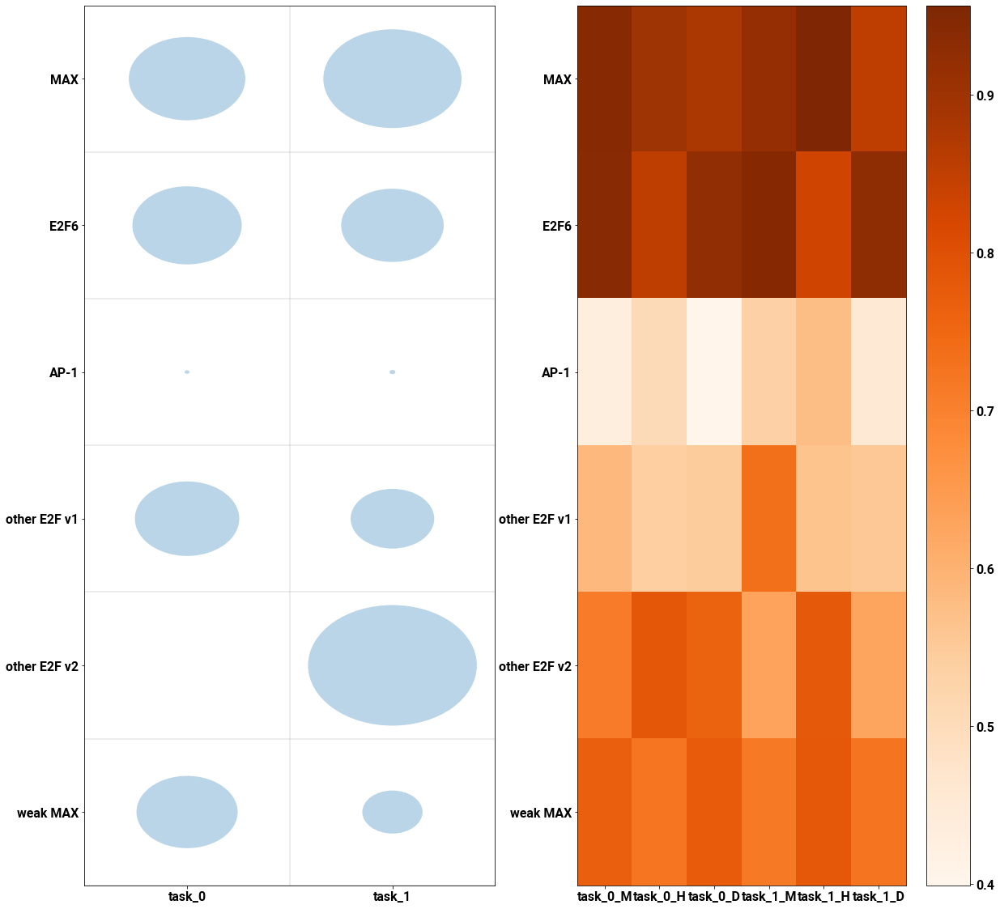

In [20]:
fig, ax = plt.subplots(ncols=2, figsize=(20, 20))

# Plot motif prevalences in each task

y, x = np.unravel_index(np.arange(motif_prevalences.size), motif_prevalences.shape)
x, y = x + 0.5, y + 0.5

# Scale the radius to have a maximum of 0.5
radius = motif_prevalences * 0.5  # The maximum prevalence should be 1

# Plot the data
ax[0].set_xlim(0, motif_prevalences.shape[1])
ax[0].set_ylim(0, motif_prevalences.shape[0])
ax[0].set_xticks(np.arange(0.5, motif_prevalences.shape[1] + 0.5))
ax[0].set_yticks(np.arange(0.5, motif_prevalences.shape[0] + 0.5))
ax[0].set_xticklabels(["task_%d" % i for i in np.arange(0, motif_prevalences.shape[1])])
ax[0].set_yticklabels([pair[0] for pair in core_motif_defs][::-1])  # Flip y-axis
for i in range(motif_prevalences.shape[1]):
    ax[0].axvline(i, color="gray", alpha=0.2)
for i in range(motif_prevalences.shape[0]):
    ax[0].axhline(i, color="gray", alpha=0.2)

for i in range(motif_prevalences.shape[0]):
    for j in range(motif_prevalences.shape[1]):
        circle = plt.Circle((j + 0.5, motif_prevalences.shape[0] - i - 1 + 0.5), radius[i, j], alpha=0.3)
        ax[0].add_patch(circle)
        
# Plot benchmark motif distances in each task

# Create the full array to show
full_sim_matrix = np.empty((meme_best_sims.shape[0], meme_best_sims.shape[1] * 3))
sim_matrices = [meme_best_sims, homer_best_sims, dichipmunk_best_sims]
for i in range(3):
    full_sim_matrix[:, np.arange(0, meme_best_sims.shape[1] * 3, 3) + i] = sim_matrices[i]
hm = ax[1].imshow(full_sim_matrix, cmap="Oranges")
fig.colorbar(hm)
ax[1].set_aspect("auto")
ax[1].set_xticks(np.arange(full_sim_matrix.shape[1]))
ax[1].set_yticks(np.arange(full_sim_matrix.shape[0]))
ax[1].set_yticklabels([pair[0] for pair in core_motif_defs])
ax[1].set_xticklabels(sum([["task_%d_%s" % (i, s) for s in ("M", "H", "D")] for i in range(meme_best_sims.shape[1])], []))
plt.show()

<h3>MAX</h3>

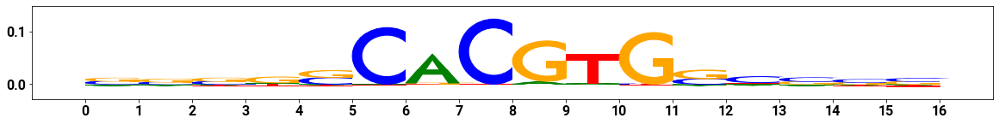

<h3>E2F6</h3>

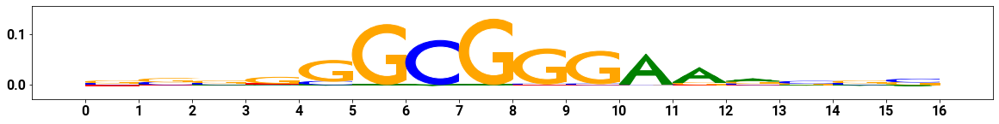

<h3>AP-1</h3>

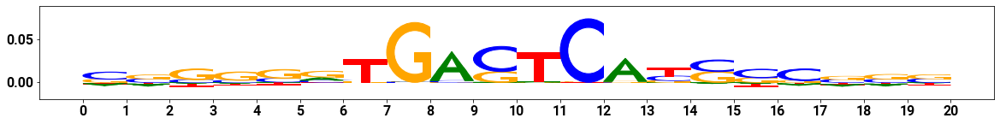

<h3>other E2F v1</h3>

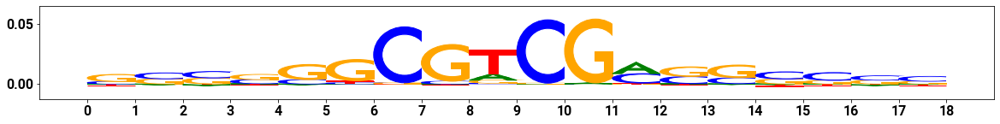

<h3>other E2F v2</h3>

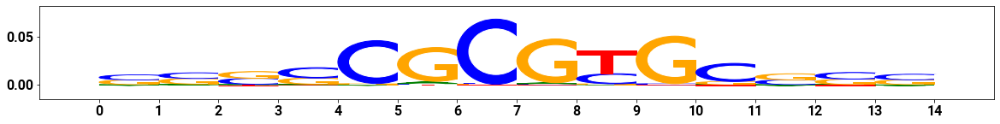

<h3>weak MAX</h3>

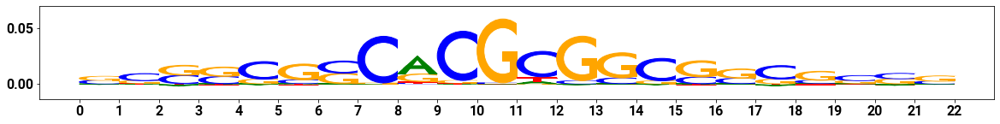

In [21]:
# Show aggregate motifs
for key, _ in core_motif_defs:
    display(vdomh.h3(key))
    viz_sequence.plot_weights(core_motif_cwms[key])